# Remise de devoir

### Auteur

* Jérémi Grenier-Berthiaume


# Énoncé du devoir

### Description:
* Proposer une notion de similarité originale et spécifiquement construite pour être utilisée avec MNIST.
* L’objectif est d'augmenter la performance de divers algorithmes.
* Comparer la performance des algorithmes suivants utilisant votre notion de similarité avec la performance obtenue avec la distance euclidienne.

### Modèles à implémenter:
* KNN
* k-medoïde
* Partition binaire (Regroupement hiérarchique)
* PCoA (c'est un cas particulier de MDS)
* Isomap

### Conseils et indications:
* Si on effectue une légère translation de l’image, cela ne devrait pas affecter sa similarité. 
* Il est permis de faire un prétraitement des données pour accélérer le calcul de la similarité. 
* La notion de similarité n’a pas besoin d’être une distance, mais elle doit se comporter de façon similaire. 
* Il est parfois nécessaire dans la phase exploratoire (ou même finale) de travailler avec des jeux de donnée de taille réduite. 
* Dans le cas de Partition binaire, utilisez la variation basée sur la moyenne des distances.

### Critère d’évaluation:
* Originalité.
* La qualité des résultats obtenus avec votre similarité.
* La perte de performance si on compare avec la distance euclidienne (ou le gain si c’est le cas).
* Le rapport doit mettre en lumière de façon claire et honnête les forces et faiblesses de la similarité proposée.

# Le devoir

En premier lieu, importons simplement toutes les librairies nécessaires pour le projet.

In [294]:
import csv
import math
import warnings
import numpy as np
from time import time
from itertools import product
import matplotlib.pyplot as plt
from matplotlib import offsetbox
from scipy.sparse.csgraph import dijkstra

# Models
from sklearn import manifold                         # ISOMAP et PCoA (MDS)
from sklearn.neighbors import KNeighborsClassifier   # KNN
from sklearn.cluster import AgglomerativeClustering  # partition binaire
from pyclustering.cluster.kmedoids import kmedoids   # k-medoïde

# Preprocessing and metrics/scores
from sklearn import metrics
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from scipy.ndimage import interpolation

Ensuite, il faut définir la fonction qui sera utilisée pour charger en mémoire le jeu de données:

In [125]:
def get_data(reduced_path, path, use_reduced=True):
    """
    Pour obtenir le dataset désiré.
    :param reduced_path: path vers la version réduite (générée par 'pre_process.py')
    :param path: path vers la version complète
    :param use_reduced: pour utiliser un sous-ensemble de MNIST
    :return: numpy arrays (data, labels)
    """
    if use_reduced:
        data = open(reduced_path)
    else:
        data = open(path)
    csv_file = csv.reader(data)
    data_points = []
    for row in csv_file:
        data_points.append(row)
    data_points.pop(0)  # On enlève la première ligne, soit les "headers" de nos colonnes
    data.close()

    # Pour passer de String à int
    for i in range(len(data_points)):  # for each image
        for j in range(len(data_points[0])):  # for each pixel
            data_points[i][j] = int(data_points[i][j])

    # Pour séparer les labels du data
    y_ = []  # labels
    for row in data_points:
        y_.append(row[0])  # first column is the label
    x_ = []  # data
    for row in data_points:
        x_.append(row[1:785])  # other columns are the pixels

    x_ = np.array(x_)
    y_ = np.array(y_)
    print("Done with loading the dataset.")

    return x_, y_


def get_test_data(use_reduced=True):
    """
    Retourne le dataset de test désiré.
    :param use_reduced: pour utiliser un sous-ensemble de MNIST
    :return: numpy arrays (data, labels)
    """
    return get_data('data/reduced_mnist_test.csv', 'data/mnist_test.csv', use_reduced)


def get_train_data(use_reduced=True):
    """
    Retourne le dataset de training désiré.
    :param use_reduced: pour utiliser un sous-ensemble de MNIST
    :return: numpy arrays (data, labels)
    """
    return get_data('data/reduced_mnist_train.csv', 'data/mnist_train.csv', use_reduced)

Il a aussi fallu définir une manière de réduire la grosseur du jeu de données. En exécutant le code qui suit, un sous-ensemble de MNIST sera extrait afin d'accélérer les différents processus de calcul.

In [126]:
# Extract 2500 examples
with open('data/mnist_train.csv', newline='\n') as f_input, open('data/reduced_mnist_train.csv', 'w', newline='\n') as f_output:
    csv_input = csv.reader(f_input)
    csv_output = csv.writer(f_output)

    tmp = 0
    for row in csv_input:
        if tmp <= 2500:
            tmp += 1
            csv_output.writerow(row)
        else:
            break

# Extract 500 examples
with open('data/mnist_test.csv', newline='\n') as f_input, open('data/reduced_mnist_test.csv', 'w', newline='\n') as f_output:
    csv_input = csv.reader(f_input)
    csv_output = csv.writer(f_output)

    tmp = 0
    for row in csv_input:
        if tmp <= 500:
            tmp += 1
            csv_output.writerow(row)
        else:
            break


Désormais, on peut simplement charger notre jeu de donnée (réduit ou non):

In [127]:
x_train, y_train = get_train_data()  # 2500 exemplaires
x_test,  y_test  = get_test_data()   #  500 exemplaires
print(x_train.shape)
print(x_test.shape)

#x_train_full, y_train_full = get_train_data(False)  # 60000 exemplaires
#x_test_full,  y_test_full  = get_test_data(False)   # 10000 exemplaires
#print(x_train_full.shape)
#print(x_test_full.shape)

Done with loading the dataset.
Done with loading the dataset.
(2500, 784)
(500, 784)


# Terminologie

De manière générale, dans le code et possiblement les explications, on parlera de:

* **x_train**: Données utilisées pour l'entraînement (784 pixels).
* **y_train**: Le "label", ou "ground truth", ou "target", qui est le chiffre associé aux pixels de 'train'.
* **x_test**: Données utilisées pour les tests sur les prédictions en utilisant le modèle entraîné (784 pixels).
* **y_test**: Le "label", ou "ground truth", ou "target", qui est le chiffre associé aux pixels de 'test'.

Ainsi, par exemple, x_train[i] correspond aux intensités des 784 pixels qui donne une image 28x28 qui représente le chiffre stocké dans y_train[i].

# Métrique

### Motivation

Motivons d'abord la raison derrière l'idée qu'il pourrait y avoir une métrique qui performerait mieux que L2 pour déterminer la distance (ou similarité) entre deux images.

Considérons une image quelconque de MNIST: utiliser L2 pour calculer sa distance par rapport à une image identique nous donne zéro, ce qui est attendu d'une mesure de distance. Cependant, si on ne fait que bouger de 1 pixel cette image et que nous calculons sa distance avec l'image original, on se rends compte que L2 retourne une distance qui peut parfois être surprenamment grande. Il serait préférable de trouver une distance qui retournerait zéro, ou du moins quelque chose de moins drastique.

In [152]:
# L2, the euclidean distance:

def euclid_distance(x, y):
    return np.sqrt(np.sum((x-y)**2))

Quelques fonctions de base qui seront éventuellement utilisées pour étayer un peu sur le dernier paragraphe:

In [153]:
def shift_left(x, k, size):  # k est le nombre de pixels pour le shift
    copied = x.copy()
    for row in range(size):
        for i in range(size):
            curr_row = size*row
            if i >= size-k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i + k + curr_row]
    return copied


def shift_right(x, k, size):
    copied = x.copy()
    for row in range(size):
        for i in range(size):
            curr_row = size*row
            if i < k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i - k + curr_row]
    return copied


def shift_up(x, k, size):
    copied = x.copy()
    for row in range(size):
        for i in range(size):
            curr_row = size*row
            if row >= size-k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i + (size*(row+k))]
    return copied


def shift_down(x, k, size):
    copied = x.copy()
    for row in range(size):
        for i in range(size):
            curr_row = size*row
            if row < k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i + (size*(row-k))]
    return copied

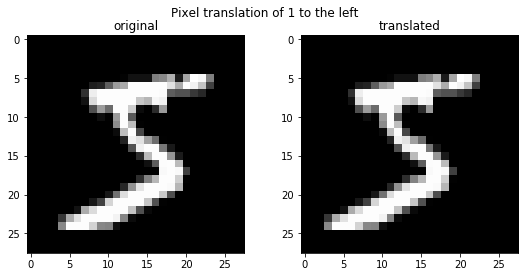

In [130]:
# Test to display a sample of a shifted image

test_size = 28
shift = 1

# translating the image
shifted_img = shift_left(x_train[0], shift, test_size)

# reshaping to show as images
original = np.reshape(x_train[0], (test_size, test_size))
to_show  = np.reshape(shifted_img, (test_size, test_size))

# to show the image
plt.figure(figsize=(9, 4))  # values of the size of the plot: (x,y) in INCHES
plt.suptitle("Pixel translation of " + str(shift) + " to the left")
plt.subplot(1, 2, 1)  # (amnt img on Y, on X, image "index")
plt.title("original")
plt.imshow(original, cmap='gray')
plt.subplot(1, 2, 2)
plt.title("translated")
plt.imshow(to_show, cmap='gray')
plt.show()

In [131]:
print("Distance entre deux fois la même image:\t\t", euclid_distance(x_train[0], x_train[0]))
print("Distance entre les deux images plus haut:\t", euclid_distance(x_train[0], shifted_img))
print("Distance entre deux chiffres différents:\t", euclid_distance(x_train[0], x_train[1]))

Distance entre deux fois la même image:		 0.0
Distance entre les deux images plus haut:	 1163.2437405806231
Distance entre deux chiffres différents:	 2387.111643807218


### Recherches préliminaires: concepts et métriques connues

J'ai tout d'abord recherché quelques distances connues pour voir si elles pouvaient surpasser L2.

*Minkowski* avec p=3, ainsi que *Cosine* surpassent *L2* en terme d'*accuracy score* pour KNN (du moins, j'ai observé 3-NN).

Durant ces recherches préliminaires, j'ai aussi croisé le chemin de plusieurs concepts intéressants:

* SSIM (Structural Similarity index)
* Shape Context
* Cross-correlation
* HOG feature extraction

In [58]:
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     89.60000000000001 %


In [59]:
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='minkowski',
                               p=3,
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     90.60000000000001 %


In [60]:
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='cosine',
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     91.4 %


### Métriques de mon cru considérées dans le cadre du devoir, mais abandonnées

J'ai pensé séparer l'image en 4 et représenter celle-ci par un vecteur qui serait tout simplement le nombre de pixels noirs dans chaque cadran (après avoir arrangé le dataset en MNIST-binaire), mais avant d'approfondir plus cette idée, j'ai plutôt préféré faire un test sur une idée utilisant un CNN (Convolutional Neural Network).

Lien vers le code utilisé pour entraîner, sauvegarder, et tester le CNN: https://gist.github.com/payne911/ebdd21d9297ca6b2ac7a04eb166d6ec1

L'idée étant que puisque le CNN donne en *output* un vecteur de 10 composantes qui représente sa "confidence" (qui est en fait une distribution de probabilité) que l'*input* appartienne à chacune des 10 classes, il serait possible d'interpréter cela comme un vecteur qui positionne notre image dans un espace en 10 dimensions.

Si la régression donne une probabilité similaire pour deux inputs différents, on peut s'attendre à ce que ces deux inputs soient en effet similaires. L'idée est donc d'utiliser la différence cumulative de chacune des probabilités des deux vecteurs pour déterminer la similarité entre ces deux images.

Par exemple, si le réseau retourne:

v1 = [0.3, 0.0, 0.5, 0.2]

v2 = [0.9, 0.1, 0.0, 0.0]

Leur différence donne, en valeur absolue: [0.6, 0.1, 0.5, 0.2]. La somme sur ces composantes donne ***1.4*** et cela représente, selon cette métrique secondaire proposée, la distance entre les deux inputs qui auraient pu appartenir à une des 4 catégories.

On remarque qu'en fait cette métrique sera toujours comprise **entre 0 et 2**. Plus le score est proche de 0, plus les 2 images sont similaires (dans le sens d'être classifiées de la même manière).

En tant que tel, faire une prédiction sur uune image en faisant un *feed-forward* dans le réseau pour obtenir le vecteur d'*output* n'est en fait qu'une série de calculs qui auraient très bien pu être extraits du réseau pour être *hard-codé*.

Le choix d'un CNN plutôt que certains autres modèles de réseaux de neuronnes provient du fait que les convolutions s'apprètent très bien à l'analyse d'images en plus d'être assez simple à produire grâce à *Keras*.

Plusieurs versions ont été créées pour optimiser et explorer cette métrique (des problématiques intéressantes de Garbage Collector et Memory Allocation ont dû être résolues pour passer d'un temps de calcul croissant à un temps constant): https://gist.github.com/payne911/ebdd21d9297ca6b2ac7a04eb166d6ec1#file-cnn_metric-py

Néanmoins, la dernière version vous est présentée ici:

In [132]:
def cnn_metric_v3(x, y, **kwargs):
    predictions = kwargs["model"].predict(np.asarray([x.reshape(28, 28, 1), y.reshape(28, 28, 1)]))
    return np.sum((abs(np.subtract(predictions[0], predictions[1]))))

Utiliser cette métrique sur KNN donne d'excellents résultats (ce qui n'est pas vraiment surprenant): **97.33%** d'*accuracy* avec le modèle que j'ai entraîné, testé sur des données qui n'avaient jamais été utilisées durant l'entraînement (c'est-à-dire qui ne faisaient pas non plus parti de l'ensemble de validation).

J'ai cependant décidé de ne pas utiliser cette "métrique" car cela semblait plus ou moins "détourner" le but du devoir.

### Présentation de la métrique utilisée pour ce devoir

La métrique est un simple "min" (minimum) appliqué au calcul de la distance (L2) entre les deux images en input, et la distance entre la première image bougée de 1 pixel de 8 manières différentes (haut, bas, gauche, droite, en haut à droite, etc.) et la seconde image. Ceci donne donc un minimum des distances entre 9 images et une autre.

Voici le premier jet qui sera utilisé pour l'évaluation du *preprocessing* qui suivra:

In [154]:
def shifted_metric(x, y, **kwargs):
    """
    Should eventually include the hyperparameter that allows one
    to decide how many pixel_shifts should be tried.
    Currently, by default, it's 1.
    The version commented above is a start.
    :param x: 
    :param y: 
    :param kwargs: shifts = amount of pixel translated
    size = size of the image (square-root of it's flattened dimension)
    :return: minimum distance between all shifts (including original)
    """

    def multi_shifter(k, size):
        """
        To calculate the minimum distance for a shift of 'k' pixels.
        Eventually returns the minimum among the minimums for each k.
        Includes k=0 (the base case which is simply L2).
        :param k: maximal amount of pixels to shift
        :return: the minimum among the minimums for each k.
        """
        scores = []
        for shift_amnt in range(k + 1):
            scores.append(shifter(x, y, shift_amnt, size))
        #print(scores)
        return min(scores)  # get the minimum among all

    score = multi_shifter(kwargs["shifts"], kwargs["size"])
    #print("Minimal distance is:", score)

    return score


def shifter(x, y, k, size):
    """
    Shifts the image X of k pixels in all directions.
    :param x: image that will be pixel_shifted
    :param y: target image used to calculate L2
    :param k: amount of pixels to translate
    :return: minimal distance among all translations
    """
    if k == 0:  # compute L2 (base case, no shift at all)
        return euclid_distance(x, y)

    left = shift_left(x, k, size)
    right = shift_right(x, k, size)
    up = shift_up(x, k, size)
    down = shift_down(x, k, size)

    top_left = shift_left(up, k, size)
    top_right = shift_right(up, k, size)
    bot_left = shift_left(down, k, size)
    bot_right = shift_right(down, k, size)

    # on calcule le minimum des distances entre les shifts et Y
    dist = min(euclid_distance(left, y),
               euclid_distance(right, y),
               euclid_distance(up, y),
               euclid_distance(down, y),
               euclid_distance(top_left, y),
               euclid_distance(top_right, y),
               euclid_distance(bot_left, y),
               euclid_distance(bot_right, y))

    return dist

J'ai donc tout d'abord effectué quelques tests qui semblaient prometteurs:

In [155]:
# Unit tests: the 'custom metric' vs 'L2'

print("\nIf 'Custom metric' is smaller than 'L2' it means the metric has found a closer distance by translating the input by 1 pixel in a direction.")

print("\nFor different data labeled", y_train[0], "vs", y_train[11])
print("Custom metric:", shifted_metric(x_train[0], x_train[11], shifts=1, size=28))
print("L2:", euclid_distance(x_train[0], x_train[11]))

print("\nFor different data labeled", y_train[0], "vs", y_train[1])
print("Custom metric:", shifted_metric(x_train[0], x_train[1], shifts=1, size=28))
print("L2:", euclid_distance(x_train[0], x_train[1]))

print("\nFor different data labeled", y_train[1], "vs", y_train[21])
print("Custom metric:", shifted_metric(x_train[1], x_train[21], shifts=1, size=28))
print("L2:", euclid_distance(x_train[1], x_train[21]))

print("\nFor different data labeled", y_train[1], "vs", y_train[2])
print("Custom metric:", shifted_metric(x_train[1], x_train[2], shifts=1, size=28))
print("L2:", euclid_distance(x_train[1], x_train[2]))

print("\nFor same sample (should be 0.0)")
print("Custom metric:", shifted_metric(x_train[1], x_train[1], shifts=1, size=28))
print("L2:", euclid_distance(x_train[1], x_train[1]))

print("\nFor same sample, translated by 1 pixel (should be 0.0)")
shifted_test_img = shift_left(x_train[2], 1, test_size)
print("Custom metric:", shifted_metric(shifted_test_img, x_train[2], shifts=1, size=28))
print("L2:", euclid_distance(shifted_test_img, x_train[2]))

print("\nSymetric situation from last test (should be 0.0)")
shifted_test_img = shift_left(x_train[2], 1, test_size)
print("Custom metric:", shifted_metric(x_train[2], shifted_test_img, shifts=1, size=28))
print("L2:", euclid_distance(x_train[2], shifted_test_img))


If 'Custom metric' is smaller than 'L2' it means the metric has found a closer distance by translating the input by 1 pixel in a direction.

For different data labeled 5 vs 5
Custom metric: 2700.834870924174
L2: 2867.4593283950862

For different data labeled 5 vs 0
Custom metric: 2379.605849715452
L2: 2387.111643807218

For different data labeled 0 vs 0
Custom metric: 1388.005763676794
L2: 1388.005763676794

For different data labeled 0 vs 4
Custom metric: 2819.60812880088
L2: 2898.932907122895

For same sample (should be 0.0)
Custom metric: 0.0
L2: 0.0

For same sample, translated by 1 pixel (should be 0.0)
Custom metric: 0.0
L2: 1454.5439147719123

Symetric situation from last test (should be 0.0)
Custom metric: 0.0
L2: 1454.5439147719123


Comme prévu, cette métrique retourne toujours une valeur égale ou inférieure à L2. En fait, les propriétés de non-négativité ainsi que d'identité sont préservées.

Il serait possible d'intégrer un algorithme qui permet de faire des tests sur un nombre arbitraire de translations autour du centre de l'image initiale, mais cela rendait les calculs un peu trop long alors j'ai décidé de simplement implémenter une translation de 1 (ce qui réponds au critère de l'énoncé). Cette valeur est en fait un hyperparamètre de cette métrique.

Le second hyperparamètre offre la possibilité de choisir la dimension de l'image traitée afin de permettre des tests plus flexibles (sur différentes réductions de dimentionalité).

Cependant, mentionnons la possibilité d'introduction de diminution d'une distance pour une mauvaise raison: imaginons que l'on compare un "1" avec un "4". On remarque qu'il y a une barre verticale dans les deux cas: si le jeu de données n'était pas aussi étendu que MNIST, il serait possible qu'une translation de 1 pixel horizontalement sur le "1" le rende plus semblable au "4" qu'à tous les autres "1" du jeu de données (par exemple, si tous les autres "1" étaient écrits d'une manière plus "angulée").

# Preprocessing

On parle ici de modifier le jeu de données MNIST avant de le passer en paramètre aux différents algorithmes. Ma compréhension est que, dans le cadre de ce devoir, ce *preprocessing* est un outil de plus à utiliser pour tenter d'améliorer les résultats de notre métrique par rapport à L2. Idéalement, il faudrait tenter d'utiliser le *preprocessing* pour produire une métrique adaptée aux transformations effectuées.

Pour les *benchmarks*, je vais utiliser KNN puisque le *accuracy score* est très facilement interprétable.

### Exploration de la réduction de dimentionalité

Cela m'a mené à considérer la réduction de dimentionalité pour plusieurs raisons:

* Diminution de la possibilité de sur-apprentissage
* Diminution du temps de calcul
* Diminution de l'impacte du "curse of dimentionality"

Ainsi, j'ai utilisé une fonction qui a servi à se donner une idée d'à quel point on peut capturer la variance du dataset en fonction d'un certain nombre de composantes.

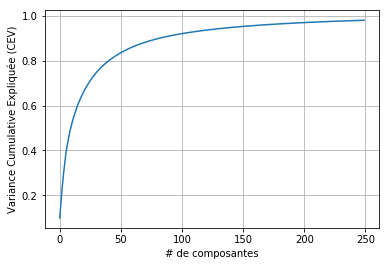

In [135]:
pca = PCA(n_components=250)
pca = pca.fit(x_train)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.grid()
plt.xlabel('# de composantes')
plt.ylabel('Variance Cumulative Expliquée (CEV)')
plt.show()

On remarque qu'avec 50 composantes, on capture déjà plus de 80% de la variance du dataset, et qu'avec 100 composantes, c'est près de 90%! Passer de 784 composantes à moins de 100 est un gain majeur en terme d'efficacité (temps de calcul, utilisation de la mémoire, etc.).

Le graphique ci-haut n'utilise que 250 composantes pour des raisons de visualisation, mais calculer le PCA sur 784 composantes ne prends pas si longtemps et on peut toujours simplement conserver, par exemple, les 100 premières composantes extraites et cela revient exactement au même que d'avoir calculé le PCA pour 100 composantes sur les mêmes données.

In [136]:
pca = PCA(n_components=784)

x_train_trans = pca.fit_transform(x_train)

# those separations are used temporarily for minor tests
x_train_pca, x_test_pca, y_train_pca, y_test_pca = train_test_split(
    x_train_trans, y_train, test_size=0.2, random_state=1)

Sachant que le but du *preprocessing* est, entre autres, de tenter d'améliorer la performance de ma métrique, observons un *heatmap* d'une petite région de la topologie locale de celle-ci en fonction de la réduction de dimentionalité.

(distance) Components =  16 , neighbors =  2 , Score =  0.768
(distance) Components =  16 , neighbors =  3 , Score =  0.766
(distance) Components =  16 , neighbors =  4 , Score =  0.774
(distance) Components =  16 , neighbors =  5 , Score =  0.762
(distance) Components =  16 , neighbors =  6 , Score =  0.764
(distance) Components =  16 , neighbors =  7 , Score =  0.76
(distance) Components =  25 , neighbors =  2 , Score =  0.808
(distance) Components =  25 , neighbors =  3 , Score =  0.794
(distance) Components =  25 , neighbors =  4 , Score =  0.8
(distance) Components =  25 , neighbors =  5 , Score =  0.77
(distance) Components =  25 , neighbors =  6 , Score =  0.768
(distance) Components =  25 , neighbors =  7 , Score =  0.744
(distance) Components =  36 , neighbors =  2 , Score =  0.832
(distance) Components =  36 , neighbors =  3 , Score =  0.82
(distance) Components =  36 , neighbors =  4 , Score =  0.818
(distance) Components =  36 , neighbors =  5 , Score =  0.784
(distance) Co

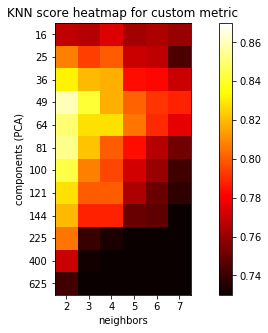

In [137]:
# adapted from  https://www.kaggle.com/gregnetols/mnist-with-pca-and-knn
n_neighbors = 8
components  = [4**2, 5**2, 6**2, 7**2, 8**2, 9**2, 10**2, 11**2, 12**2, 15**2, 20**2, 25**2]
neighbors   = list(range(2,n_neighbors))
scores_cd   = np.zeros((components[len(components) - 1] + 1, neighbors[len(neighbors) - 1] + 1))

for component in components:
    for n in neighbors:
        size = int(math.sqrt(component))
        knn = KNeighborsClassifier(n_neighbors=n,
                                   metric=shifted_metric,
                                   metric_params={"size":size, "shifts":1},
                                   weights='distance',
                                   n_jobs=-1)
        knn.fit(x_train_pca[:, :component], y_train_pca)
        score = knn.score(x_test_pca[:, :component], y_test_pca)
        scores_cd[component][n] = score
        print('(distance) Components = ', component, ', neighbors = ', n, ', Score = ', score)

scores_cd = np.reshape(scores_cd[scores_cd != 0], (len(components), len(neighbors)))

x_axis = list(range(0,n_neighbors-2))
y_axis = list(range(0,len(components)))


plt.figure(figsize=(10, 5))
plt.title("KNN score heatmap for custom metric")
plt.rcParams["axes.grid"] = False
plt.imshow(scores_cd, cmap='hot', interpolation='none', vmin=.73, vmax=0.87)
plt.xlabel('neighbors')
plt.ylabel('components (PCA)')
plt.xticks(x_axis, neighbors)
plt.yticks(y_axis, components)
plt.colorbar()

plt.show()

Regardons désormais un exemple de notre métrique appliquée sans réduction de dimentionalité.

In [67]:
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     92.60000000000001 %


On remarque que la réduction de dimentionalité n'aide pas vraiment. En effet, voici le meilleur résultat: **Components =  49 , neighbors =  2 , Score =  0.86**. On a, sans réduction, un bien meilleur score (**92.6%**).

Cela est en fait normal si on considère le fait que les différentes composantes d'une réduction de dimentionalité ne sont généralement pas du tout les mêmes que celles qui composaient l'*input* initialement. Ainsi, alors qu'avant on avait un pixel par dimension, on se retrouve avec "quelque chose d'autre" pour chaque dimension. Une translation de "1 pixel" (car le code continue d'interpréter le vecteur comme une matrice carrée) fini par complètement détruire l'idée des composantes de la réduction de dimentionalité. De plus, le code introduit des valeurs arbitraires (par exemple, une translation vers la gauche va introduire une colonne de pixels blancs à droite).

J'abandonne donc cette idée, même si elle fonctionnait très bien pour des métriques comme L2.

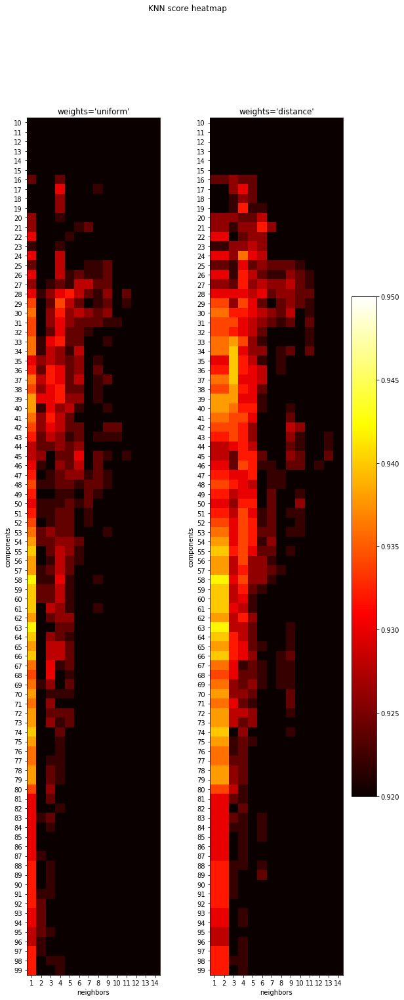

In [24]:
# adapted from  https://www.kaggle.com/gregnetols/mnist-with-pca-and-knn
n_components = 100
n_neighbors  = 15
components   = list(range(10,n_components))
neighbors    = list(range(1,n_neighbors))

scores_uniform  = np.zeros((components[len(components) - 1] + 1, neighbors[len(neighbors) - 1] + 1))
scores_distance = np.zeros((components[len(components) - 1] + 1, neighbors[len(neighbors) - 1] + 1))

for component in components:
    for n in neighbors:
        knn = KNeighborsClassifier(n_neighbors=n,
                                   metric='minkowski',
                                   p=2,
                                   weights='uniform')
        knn.fit(x_train_pca[:, :component], y_train_pca)
        score = knn.score(x_test_pca[:, :component], y_test_pca)
        scores_uniform[component][n] = score
        #print('(uniform) Components = ', component, ', neighbors = ', n, ', Score = ', score)
        
        knn = KNeighborsClassifier(n_neighbors=n,
                                   metric='minkowski',
                                   p=2,
                                   weights='distance')
        knn.fit(x_train_pca[:, :component], y_train_pca)
        score = knn.score(x_test_pca[:, :component], y_test_pca)
        scores_distance[component][n] = score
        #print('(distance) Components = ', component, ', neighbors = ', n, ', Score = ', score)

scores_uniform  = np.reshape(scores_uniform[scores_uniform != 0], (len(components), len(neighbors)))
scores_distance = np.reshape(scores_distance[scores_distance != 0], (len(components), len(neighbors)))

x_axis = list(range(0,n_neighbors-1))
y_axis = list(range(0,n_components-10))

plt.figure(figsize=(10, 24))
plt.suptitle("KNN score heatmap")

plt.subplot(1,2,1)
plt.rcParams["axes.grid"] = False
plt.imshow(scores_uniform, cmap='hot', interpolation='none', vmin=.92, vmax=0.95)
plt.xlabel('neighbors')
plt.ylabel('components')
plt.xticks(x_axis, neighbors)
plt.yticks(y_axis, components)
plt.title("weights='uniform'")

plt.subplot(1,2,2)
plt.rcParams["axes.grid"] = False
plt.imshow(scores_distance, cmap='hot', interpolation='none', vmin=.92, vmax=0.95)
plt.xlabel('neighbors')
plt.ylabel('components')
plt.xticks(x_axis, neighbors)
plt.yticks(y_axis, components)
plt.title("weights='distance'")
plt.colorbar()

plt.show()

Grâce au '*heatmap*' on peut voir qu'il existe une sorte de maximum local lorsqu'on observe aux alentours de 36 composantes, et un autre autour de 60.

En soit, on peut conclure que **Components =  58 , neighbors =  1 , Score =  0.9419** est le "meilleur" choix parmi ceux présentés (**36 composantes** reste néanmoins intéressant puisque c'est beaucoup moins de composantes).

Remarquons qu'en changeant la taille de l'*input* (c'est-à-dire la grosseur du jeu de données utilisée), la topologie changerait fort probablement et l'optimum local ne serait possiblement plus à "58".

In [69]:
# avec réduction
nComp = 58
knn_clf = KNeighborsClassifier(n_neighbors=1,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_pca[:,:nComp], y_train_pca)
accuracy = knn_clf.score(x_test_pca[:,:nComp], y_test_pca) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.19999999999999 %


In [72]:
# sans réduction
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     89.60000000000001 %


Cette comparaison est relativement flouée puisqu'on n'utilise pas exactement les mêmes ensembles (parce que l'ordre des labels après la transformation PCA est perdu, on a appliqué PCA sur *x_train* et séparé cette transformation en 4 sous-ensembles "_pca"). De plus, j'ai utilisé le "k" qui optimise chacun individuellement.

Cependant, sachant que ce sont des sous-ensembles (i.e. l'algo avec réduction utilisait moins d'exemplaires) et que l'on parle de KNN, le fait que la performance ai augmentée est un très bon signe.

Et de toute manière, ceci n'était que pour justifier l'exploration de la réduction de dimentionalité car je n'appliquerai aucun *preprocessing* pour les "versions L2" des algorithmes de base qu'on cherche à surpasser.

Le graphe ci-dessous montre la performance de L2 sur 1-NN en fonction du nombre de composantes.

Maximum is: 94.19999999999999


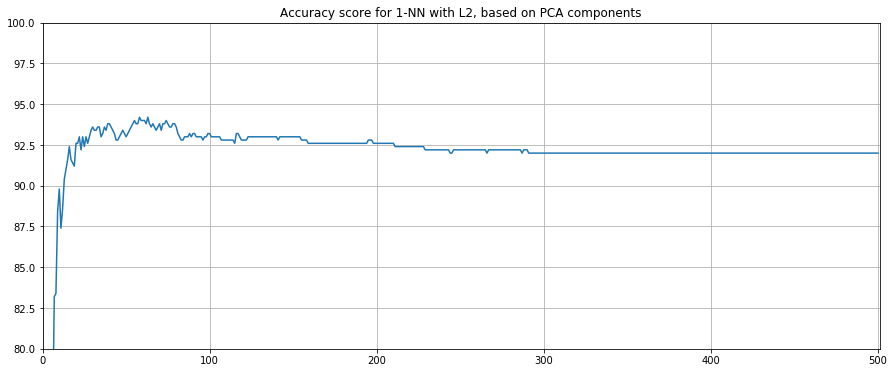

In [151]:
test_range  = 500
test_values = list(range(1,test_range+1))

# tableaux du "accuracy score"
uniform_results  = []

for nComp in test_values:  # will test all 'k' values from 1 to 'test_range'
    knn_clf = KNeighborsClassifier(1,
                                   metric='euclidean',
                                   weights='uniform')
    knn_clf.fit(x_train_pca[:,:nComp], y_train_pca)

    accuracy = knn_clf.score(x_test_pca[:,:nComp], y_test_pca) * 100
    uniform_results.append(accuracy)

print("Maximum is:", max(uniform_results))

plt.figure(figsize=(15, 6))
plt.plot(test_values, uniform_results, '-')
plt.axis([0, test_range+1, 80, 100])
plt.grid()
plt.title("Accuracy score for 1-NN with L2, based on PCA components")
plt.show()

#### MNIST-binaire

Enlever le "bruit" du jeu de données peut être une bonne idée pour aider les algorithmes à "prendre des décisions" ou tout simplement pour simplifier certaines équations.

In [141]:
x_train_binary = np.zeros((x_train.shape[0], x_train.shape[1]))
x_test_binary  = np.zeros((x_test.shape[0], x_test.shape[1]))


#Nous devons diviser par 255.0 et non 255 pour convertir ces int en float

for i in range(len(x_train)):
    for j in range(len(x_train[0])):
        x_train_binary[i][j] = round(int(x_train[i][j]) / 255.0)
            
for i in range(len(x_test)):
    for j in range(len(x_test[0])):
        x_test_binary[i][j] = round(int(x_test[i][j]) / 255.0)

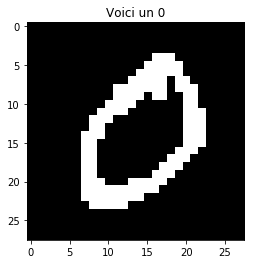

In [142]:
def display_data(x_train, y_train):
    """
    Affiche le digit voulu.
    :param x_train: le data (784D)
    :param y_train: le label associé
    :return:
    """
    matrix = np.reshape(x_train, (28, 28))  # 784 à 28x28
    plt.imshow(matrix, cmap='gray')
    plt.title("Voici un " + str(y_train))
    plt.show()
    
display_data(x_train_binary[1], y_train[1])

In [76]:
# L2, sur MNIST-binaire
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_binary, y_train)
accuracy = knn_clf.score(x_test_binary, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     86.8 %


In [77]:
# L2, sans preprocessing
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     89.60000000000001 %


On remarque que cela ne semble pas aider L2. Regardons pour notre métrique:

In [78]:
# notre métrique, sur MNIST-binaire
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train_binary, y_train)
accuracy = knn_clf.score(x_test_binary, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     86.2 %


In [67]:
# notre métrique, sans preprocessing
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     92.60000000000001 %


Encore une fois, il n'y a clairement pas d'avantage obtenu.

#### Deskewing

Tentons de "rectifier" les images (rendre plus rectiligne certains "penchements" des chiffres, comme les "1" qui sont écrits en diagonale). Si fait correctement, il serait étonnant que cela n'augmente pas la précision d'un classifieur comme KNN.

Ce site explique relativement bien le processus: https://fsix.github.io/mnist/Deskewing.html#Deskewing. (En fait, le code ci-dessous est une version légèrement modifiée de celui présenté là.)

In [143]:
# from  https://stackoverflow.com/questions/43577665/deskew-mnist-images

def moments(image):
    c0,c1 = np.mgrid[:image.shape[0],:image.shape[1]] # A trick in numPy to create a mesh grid
    totalImage = np.sum(image) #sum of pixels
    m0 = np.sum(c0*image)/totalImage #mu_x
    m1 = np.sum(c1*image)/totalImage #mu_y
    m00 = np.sum((c0-m0)**2*image)/totalImage #var(x)
    m11 = np.sum((c1-m1)**2*image)/totalImage #var(y)
    m01 = np.sum((c0-m0)*(c1-m1)*image)/totalImage #covariance(x,y)
    mu_vector = np.array([m0,m1]) # Notice that these are \mu_x, \mu_y respectively
    covariance_matrix = np.array([[m00,m01],[m01,m11]]) # Do you see a similarity between the covariance matrix
    return mu_vector, covariance_matrix

def deskew(image):
    c,v = moments(image)
    alpha = v[0,1]/v[0,0]
    affine = np.array([[1,0],[alpha,1]])
    ocenter = np.array(image.shape)/2.0
    offset = c-np.dot(affine,ocenter)
    img = interpolation.affine_transform(image,affine,offset=offset)
    return (img - img.min()) / (img.max() - img.min())

def deskewAll(X):
    currents = []
    for i in range(len(X)):
        currents.append(deskew(X[i].reshape(28,28)).flatten())
    return np.array(currents)

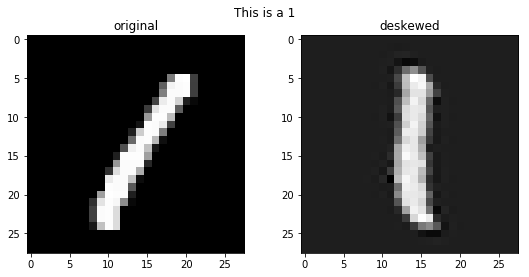

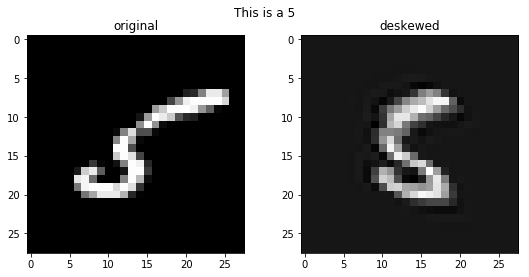

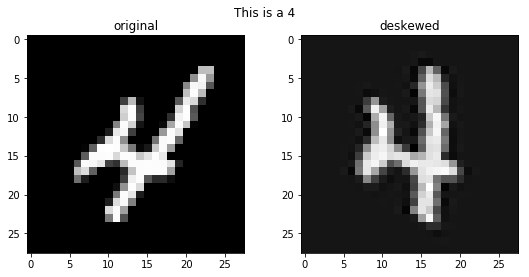

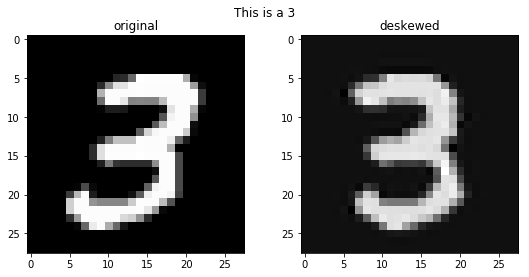

In [144]:
x_train_deskewed = deskewAll(x_train)
x_test_deskewed  = deskewAll(x_test)

for i in [3,11,9,7]:
    plt.figure(figsize=(9, 4))  # values of the size of the plot: (x,y) in INCHES
    plt.suptitle("This is a " + str(y_train[i]))
    plt.subplot(1, 2, 1)  # (amnt img on Y, on X, image "index")
    plt.title("original")
    plt.imshow(x_train[i].reshape(28,28), cmap='gray')
    plt.subplot(1, 2, 2)
    plt.title("deskewed")
    plt.imshow(x_train_deskewed[i].reshape(28,28), cmap='gray')
    plt.show

Regardons le comportement de L2:

In [91]:
# L2, avec 'deskewed'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_deskewed, y_train)
accuracy = knn_clf.score(x_test_deskewed, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


In [92]:
# L2, sans 'preprocessing'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     89.60000000000001 %


On observe donc un **gain de 4.8%** (et il est intéressant de remarquer que le *accuracy score* est le même pour k=1, k=2 et k=3 avec L2 utilisant le jeu de données *deskewed*).

Regardons maintenant le comportement de notre métrique:

In [156]:
# notre métrique, avec 'deskewed'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train_deskewed, y_train)
accuracy = knn_clf.score(x_test_deskewed, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


In [67]:
# notre métrique, sans 'preprocessing'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     92.60000000000001 %


Le gain est donc de **1.8%** !

En somme, mentionnons que plus le jeu de données augmentera en taille, moins on s'attendrait à un gain de performance de la part d'un tel *preprocessing*. Cependant, il serait possible de plutôt utiliser cette technique de *deskewing* pour faire du *data augmentation* ce qui aura alors définitivement pour effet d'augmenter la précision. Par contre, puisque nos quelques milliers d'exemplaires prennent déjà plus ou moins longtemps à traiter, je ne vais pas présenter de tels résultats ici.

De plus, mentionnons qu'il y a un aspect de cette méthode qui pourrait être mitigé afin de rendre les résultats encore meilleurs: le *deskewing* introduit un bruit de fond (dans le *background*) d'intensité variable. Cela veut dire que la notion de similarité va être légèrement détournée par ce bruit. On pourrait donc penser qu'idéalement il faudrait introduire une manière de normaliser les *backgrounds* afin de retrouver les fonds noirs originaux.

In [230]:
def black_bg(x):
    NUMBER_OF_PIXELS_TO_SWITCH = 3
    black = x.copy()
    to_switch = black[0] # premier pixel
    countPixels = 0

    for i in range(0, len(black)):
        if countPixels >= NUMBER_OF_PIXELS_TO_SWITCH:
            for j in range(1, NUMBER_OF_PIXELS_TO_SWITCH+1) :
                black[i-j] = 0
            countPixels = 0
        if black[i] <= to_switch+0.1:
            countPixels +=1
        else :
            countPixels = 0
    i = 0
    column = 0
    countPixels = 0
    lasti = 0
    while i != len(black)-1:
        if countPixels >= NUMBER_OF_PIXELS_TO_SWITCH:
            for j in range(1, NUMBER_OF_PIXELS_TO_SWITCH + 1):
                black[lasti - 28*j] = 0
            countPixels = 0
        if x[i] <= to_switch + 0.1:
            countPixels += 1
        else:
            countPixels = 0
        i += 28
        lasti = i
        if i > len(black)-1:
            lasti = i
            column += 1
            i = column

    if black[len(black)-1] <= to_switch + 0.1:
        black[len(black) - 1] = 0

    return black


def black_for_all(x):
    to_return = x.copy()
    for i in range(len(x)):
        to_return[i] = black_bg(x[i])
    return to_return


x_train_desk_bbg = black_for_all(x_train_deskewed)
x_test_desk_bbg  = black_for_all(x_test_deskewed)

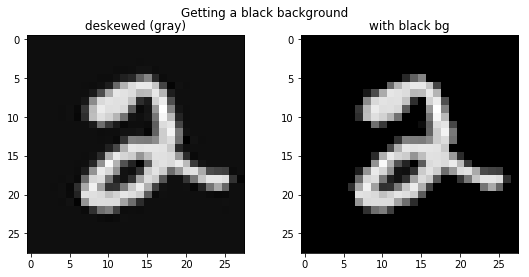

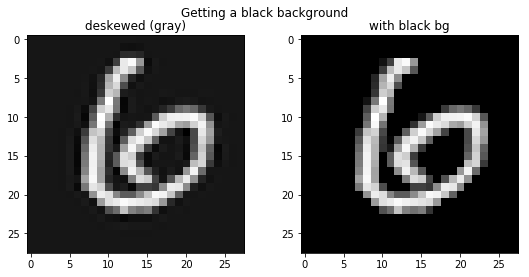

In [231]:
def display_bbg_sample(x, y):
    # reshaping to show as images
    original = np.reshape(x, (28, 28))
    to_show = np.reshape(y, (28, 28))

    # to show the image
    plt.figure(figsize=(9, 4))  # values of the size of the plot: (x,y) in INCHES
    plt.suptitle("Getting a black background")
    plt.subplot(1, 2, 1)  # (amnt img on Y, on X, image "index")
    plt.title("deskewed (gray)")
    plt.imshow(original, cmap='gray')
    plt.subplot(1, 2, 2)
    plt.title("with black bg")
    plt.imshow(to_show, cmap='gray')
    plt.show()

display_bbg_sample(x_train_deskewed[5], x_train_desk_bbg[5])
display_bbg_sample(x_test_deskewed[11], x_test_desk_bbg[11])

Refaisons maintenant nos tests:

In [178]:
# L2, avec 'deskewed'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_deskewed, y_train)
accuracy = knn_clf.score(x_test_deskewed, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


In [179]:
# L2, avec 'deskewed' et 'postprocessing' (black background)
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_desk_bbg, y_train)
accuracy = knn_clf.score(x_test_desk_bbg, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.19999999999999 %


Étonnament, on remarque une diminution des performances. C'est fort probablement dû au fait que la marge de manoeuvre intégrée dans le code pour réarranger le fond enlève de l'information sur les formes des digits. Observons néanmoins le comportement de notre métrique avec cette transformation de plus:

In [156]:
# notre métrique, avec 'deskewed'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train_deskewed, y_train)
accuracy = knn_clf.score(x_test_deskewed, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


In [180]:
# notre métrique, avec 'deskewed' et 'postprocessing' (black background)
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train_desk_bbg, y_train)
accuracy = knn_clf.score(x_test_desk_bbg, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.8 %


On note une augmentation de **0.4%** !

Mais tentons de changer légèrement l'approche et de ne pas complètement retransformer le fond en noir.

In [232]:
def black_bg_2(x):
    NUMBER_OF_PIXELS_TO_SWITCH = 3
    black = x.copy()
    to_switch = black[0] # premier pixel
    countPixels = 0

    for i in range(0, len(black)):
        if countPixels >= NUMBER_OF_PIXELS_TO_SWITCH:
            for j in range(1, NUMBER_OF_PIXELS_TO_SWITCH+1) :
                black[i-j] = 0
            countPixels = 0
        if black[i] == to_switch:  # plus aucune marge
            countPixels +=1
        else :
            countPixels = 0
    i = 0
    column = 0
    countPixels = 0
    lasti = 0
    while i != len(black)-1:
        if countPixels >= NUMBER_OF_PIXELS_TO_SWITCH:
            for j in range(1, NUMBER_OF_PIXELS_TO_SWITCH + 1):
                black[lasti - 28*j] = 0
            countPixels = 0
        if x[i] == to_switch:  # plus aucune marge
            countPixels += 1
        else:
            countPixels = 0
        i += 28
        lasti = i
        if i > len(black)-1:
            lasti = i
            column += 1
            i = column

    if black[len(black)-1] == to_switch:  # plus aucune marge
        black[len(black) - 1] = 0

    return black


def black_for_all_2(x):
    to_return = x.copy()
    for i in range(len(x)):
        to_return[i] = black_bg_2(x[i])
    return to_return


x_train_desk_bbg_2 = black_for_all_2(x_train_deskewed)
x_test_desk_bbg_2  = black_for_all_2(x_test_deskewed)

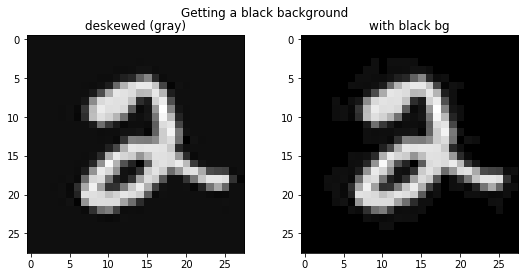

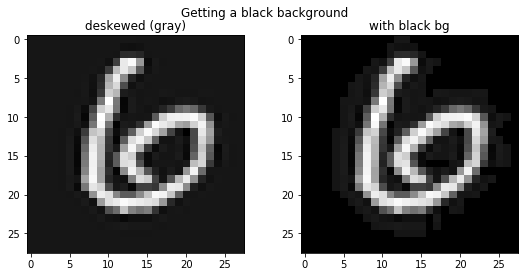

In [233]:
display_bbg_sample(x_train_deskewed[5], x_train_desk_bbg_2[5])
display_bbg_sample(x_test_deskewed[11], x_test_desk_bbg_2[11])

In [194]:
# L2, avec 'deskewed'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_deskewed, y_train)
accuracy = knn_clf.score(x_test_deskewed, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


In [195]:
# L2, avec 'deskewed' et 'postprocessing' (partial black background)
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train_desk_bbg_2, y_train)
accuracy = knn_clf.score(x_test_desk_bbg_2, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


Aucun gain pour L2. Qu'en est-il pour notre métrique?

In [156]:
# notre métrique, avec 'deskewed'
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train_deskewed, y_train)
accuracy = knn_clf.score(x_test_deskewed, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     94.39999999999999 %


In [196]:
# notre métrique, avec 'deskewed' et 'postprocessing' (partial black background)
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               metric_params={"size":28, "shifts":1},
                               weights='distance')
knn_clf.fit(x_train_desk_bbg_2, y_train)
accuracy = knn_clf.score(x_test_desk_bbg_2, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     95.0 %


On note une augmentation de **0.6%** !

Peut-être pourrais-je tenter de justifier ce gain en argumentant que l'information qui n'est plus touché par cette version modifiée donne quelques informations supplémentaires par rapport au chiffre observé: il est possible que la teinte de ce "bruit" soit dépendante du chiffre lui-même, ou encore que l'extension des courbes et lignes donnent plus d'indices à KNN.

Il y aurait encore de la recherche à faire pour approfondir notre compréhension de ce gain, mais je ne vais pas le faire  (en soit, je ne suis pas certains que cette transformation aurait autant d'impacte sur un *dataset* plus grand).

En plus, on pourrait s'inspirer du procédé de MNIST pour tenter d'encadrer toutes les données dans un carré de 24x24 pixels pour ensuite placer celui-ci dans un carré de 28x28 pixels pour finalement le bouger pour centrer le centre de masse des pixels. Certainement, la transformation de *deskewing* a déplacé ce centre de masse, mais une fois de plus je ne vais pas chercher à faire cela.

Ultimement, j'aurais aussi pu atténuer le *curse of dimentionality* en analysant, à travers les 70000 exemplaires, quels sont les pixels (en terme de position) qui sont toujours d'une valeur de 0. On pourrait fort probablement se débarasser de plusieurs d'entre eux pour obtenir un cadre plus petit.

#### Considération finale: simplifier la métrique

Sachant que je ne vais plus utiliser les hyperparamètres de la métrique que j'utilisais pour la phase de recherche, simplifions-la quelque peu. Ceci a pour avantage de diminuer l'indirection (qui peut créer de l'*overhead*) et d'accélérer son calcul (très léger gain au niveau de la compilation car il y aura moins d'instruction-machine, en plus d'épargner certaines allocations-mémoire de quelques variables).

In [201]:
def shift_left(x, k):  # k est le nombre de pixels pour le shift
    copied = x.copy()
    for row in range(28):
        for i in range(28):
            curr_row = 28*row
            if i >= 28-k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i + k + curr_row]
    return copied


def shift_right(x, k):
    copied = x.copy()
    for row in range(28):
        for i in range(28):
            curr_row = 28*row
            if i < k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i - k + curr_row]
    return copied


def shift_up(x, k):
    copied = x.copy()
    for row in range(28):
        for i in range(28):
            curr_row = 28*row
            if row >= 28-k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i + (28*(row+k))]
    return copied


def shift_down(x, k):
    copied = x.copy()
    for row in range(28):
        for i in range(28):
            curr_row = 28*row
            if row < k:  # case of non-existent pixel
                copied[i + curr_row] = copied[27]
            else:
                copied[i + curr_row] = x[i + (28*(row-k))]
    return copied

In [202]:
# our custom metric, but without the "useless" hyperparameters
def shifted_metric(x, y):
    return min([shifter(x, y, 0), shifter(x, y, 1)])  # get the minimum among all


def shifter(x, y, k):
    if k == 0:  # base case, no shift at all
        return euclid_distance(x, y)

    left = shift_left(x, k)
    right = shift_right(x, k)
    up = shift_up(x, k)
    down = shift_down(x, k)

    top_left = shift_left(up, k)
    top_right = shift_right(up, k)
    bot_left = shift_left(down, k)
    bot_right = shift_right(down, k)

    # on calcule le minimum des distances entre les shifts et Y
    dist = min(euclid_distance(left, y),
               euclid_distance(right, y),
               euclid_distance(up, y),
               euclid_distance(down, y),
               euclid_distance(top_left, y),
               euclid_distance(top_right, y),
               euclid_distance(bot_left, y),
               euclid_distance(bot_right, y))

    return dist

# Méthodologie

Après cette longue introduction, je peux désormais parler de ma méthodologie.

### Algos (comparaisons)

Chacun des 5 modèles sera présenté individuellement. À chaque fois, je présenterai une version de l'implémentation de base qui utilise la distance euclidienne (L2), suivi par une implémentation "custom" utilisant la métrique proposée plus haut (***shifted_metric***). Une analyse des scores sera ensuite donnée.

Les 5 modèles sont présentés via un regroupement en 3 catégories:

* Classifieur (**KNN**)
* Clustering (**K-Médoïde** et **Partition Binaire**)
* Réduction de dimentionalité (**PCoA** et **ISOMAP**)

Pour les "versions L2", je vais utiliser **x_train** (et compagnie).

Pour les versions utilisant ma métrique, je trouvais intéressant de regarder les résultats pour les différents jeu de données 'preprocessed':

* **SM** (avec notre métrique, sans aucun *pre-processing*): **x_train** (et compagnie)
* **DESK** (avec notre métrique, et *deskewing*): **x_train_deskewed** (et compagnie)
* **BBG1** (avec notre métrique, *deskewing* et réarrangement total des fonds gris): **x_train_desk_bbg** (et compagnie)
* **BBG2** (avec notre métrique, *deskewing* et réarrangement partiel des fonds gris): **x_train_desk_bbg_2** (et compagnie)

Précalculons nos matrices qui seront réutilisées souvent (car elles sont longues à calculer):

In [121]:
# L2
l2_distance_matrix   = pairwise_distances(x_train,
                                          metric='euclidean')
# notre métrique, sans 'pre-processing'
sm_distance_matrix   = pairwise_distances(x_train,
                                          metric=shifted_metric)

# notre métrique, avec 'deskewing'
desk_distance_matrix = pairwise_distances(x_train_deskewed,
                                          metric=shifted_metric)

# notre métrique, avec 'deskewing' et 'post-processing' (completely black backgrounds)
bbg1_distance_matrix = pairwise_distances(x_train_desk_bbg,
                                          metric=shifted_metric)

# notre métrique, avec 'deskewing' et 'post-processing' (partially black backgrounds)
bbg2_distance_matrix = pairwise_distances(x_train_desk_bbg_2,
                                          metric=shifted_metric)

### Séparation du jeu de données MNIST

Plusieurs publications de recherche dans le domaine de l'apprentissage machine tentent souvent de faire du *cherry picking* au sein de leurs résultats. Il est même possible que certaines publications n'appliquent même pas correctement le principe de séparation de leur jeu de données qui leur permettrait de présenter des résultats plus réalistes et représentatifs de leur performance dans un environnement nouveau/inconnu du modèle.

Dans le cadre de ce devoir, je vais utiliser un sous-ensemble des données fournies: les 2500 premiers exemplaires des 60000 exemplaires d'entraînement pour l'entraînement, et les 500 premiers exemplaires des 10000 exemplaires de test pour la validation. **On a donc un ensemble de 3000 exemplaires** dont un peu plus de 16% sert à la validation. Il y a donc bel et bien une séparation en 3 ensembles, dont un qui pourrait être utilisé pour faire des tests sur les choix d'hyperparamètres après avoir fait le *fine tuning* avec les ensembles d'entraînement et de validation.

*Précision*: **x_test** et **y_test** font référence à l'ensemble de validation.

L'utilisation d'un jeu de données réduit est nécessaire afin d'obtenir des résultats à temps pour la remise du devoir. Bien sûr, utiliser une plus grande portion aurait donné de meilleurs résultats en général, mais étant donné que *scikit-learn* ne tient pas à intégrer l'utilisation de GPU pour faire des calculs et que l'utilisation d'une fonction "custom" pour les algorithmes rends le tout extrêmement lent je vais m'en tenir à un *dataset* réduit.

J'ai fait des tests pour m'assurer que je faisais correctement l'intégration de ma fonction en commençant tout d'abord pas l'intégration d'une fonction L2 faite à la main. Les résultats obtenus étaient les mêmes qu'avec la fonction de distance euclidienne interne de *sklearn*, quoi qu'obtenus beaucoup plus lentement.

Démontrons la nécessité de réduire le jeu de données à l'aide d'un petit test: 

In [147]:
def test_timing(amount):
    t0 = time()
    temp_l2 = pairwise_distances(x_train[:amount], metric='euclidean')
    time_l2 = time() - t0
    print("  Euclidean took:\t", time_l2, "s")

    t0 = time()
    temp_eu = pairwise_distances(x_train[:amount], metric=euclid_distance)
    time_eu = time() - t0
    print("  Custom euclid: \t", time_eu, "s")

    t0 = time()
    temp_sm = pairwise_distances(x_train[:amount], metric=shifted_metric)
    time_sm = time() - t0
    print("  Custom metric: \t", time_sm, "s")
    
    print("\n  Growth factor between built-in and custom L2     :\t", str(time_eu/time_l2))
    print("  Growth factor between built-in and custom metric :\t", str(time_sm/time_l2))
    print("  Growth factor between custom L2 and custom metric:\t", str(time_sm/time_eu))
    

print("100 samples:")
test_timing(100)
print("\n\n200 samples:")
test_timing(200)

100 samples:
  Euclidean took:	 0.005999088287353516 s
  Custom euclid: 	 0.11199426651000977 s
  Custom metric: 	 17.731907606124878 s

  Growth factor between built-in and custom L2     :	 18.66854781018997
  Growth factor between built-in and custom metric :	 2955.7670693903506
  Growth factor between custom L2 and custom metric:	 158.32870876956943


200 samples:
  Euclidean took:	 0.006000041961669922 s
  Custom euclid: 	 0.4529712200164795 s
  Custom metric: 	 72.74751925468445 s

  Growth factor between built-in and custom L2     :	 75.49467535563856
  Growth factor between built-in and custom metric :	 12124.501748390685
  Growth factor between custom L2 and custom metric:	 160.60075351373942


En doublant le nombre d'exemplaires, on remarque que la relation avec le temps requis pour les calculs n'est certainement pas linéaire. C'est la raison principale pourquoi on utilise un *dataset* de taille réduite.

En soit, pour chaque comparaison entre deux éléments, ma métrique utilise neuf fois la distance euclidienne à l'interne, en plus d'appliquer 8 fois une transformation sur un tableau de 784 éléments. Il n'est donc pas surprenant que j'arrivais à de tels résultats quand on compare "custom L2" avec "custom metric".

On pourrait se demander si la répartition n'est pas trop débalancée dans notre jeu de données:

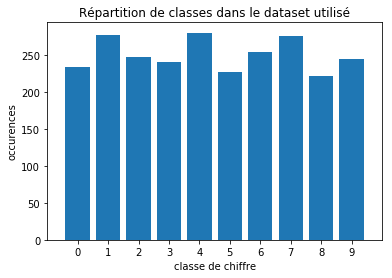

In [204]:
def class_histogram(y_train):
    counts = np.bincount(y_train)
    fig, ax = plt.subplots()
    ax.bar(range(10), counts, width=0.8, align='center')
    ax.set(xticks=range(10), xlim=[-1, 10])

    plt.title("Répartition de classes dans le dataset utilisé")
    plt.xlabel('classe de chiffre')
    plt.ylabel('occurences')
    plt.show()
    
class_histogram(y_train)

# Les modèles 

## Classifieur

Ces algorithmes prennent un *input* et retournent une catégorie. On évalue un tel modèle en comptant tout simplement le nombre de fois qu'il s'est trompé sur la prédiction.

### KNN

Quoi qu'utilisé en industrie puisqu'assez précis en terme de prédiction lorsqu'il y a beaucoup d'exemplaires, KNN est plus ou moins le contraire de ce que à quoi l'on pourrait s'attendre de la part d'un modèle de classification: l'entraînement se fait en temps constant (c'est en fait tout simplement la mise en mémoire du jeu de données), mais la prédiction dépend très fortement de la grosseur du jeu de données utilisé. Cela peut résulter en une prédiction lente, alors que généralement (en considérant que la précision de la prédiction reste la même) il serait préférable d'avoir accès à un modèle qui prends un certain temps à entraîner, mais qui est rapide à prédire.

### KNN (implémentation avec L2)

Voici le code qui a servi à faire le choix d'hyperparamètres pour l'implémentation de base:

Maximum is: 89.60000000000001 %


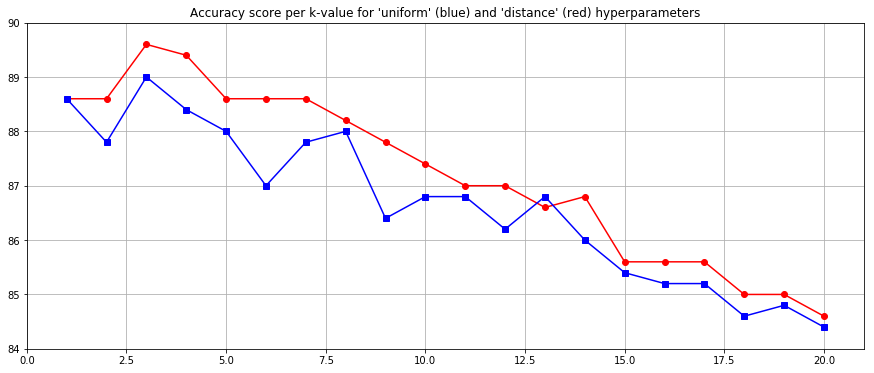

In [149]:
test_range  = 20
test_values = list(range(1,test_range+1))

# tableaux du "accuracy score" pour un des hyperparamètres à tester ("weight")
distance_results = []
uniform_results  = []

for n_neighbors in test_values:  # will test all 'k' values from 1 to 'test_range'
    #print("\nTesting  k =", n_neighbors)
    for weight in ['distance', 'uniform']:
        knn_clf = KNeighborsClassifier(n_neighbors,
                                       metric='minkowski',  # generalization requiring 'p'
                                       p=2,  # p=2 corresponds to L2 metric (euclidean)
                                       weights=weight)
        knn_clf.fit(x_train, y_train)

        accuracy = knn_clf.score(x_test, y_test) * 100
        if weight == 'distance':
            distance_results.append(accuracy)
        else:
            uniform_results.append(accuracy)
        
        #print("Accuracy ", weight, "\t= ", accuracy, "%")

#print("\nResults (distance):", distance_results)
#print("Results (uniform): ", uniform_results)

print("Maximum is:", max(distance_results), "%")


plt.figure(figsize=(15, 6))
plt.plot(test_values, distance_results, 'ro-', test_values, uniform_results, 'bs-')
plt.axis([0, test_range+1, 84, 90])
plt.grid()
plt.title("Accuracy score per k-value for 'uniform' (blue) and 'distance' (red) hyperparameters")
plt.show()

### Hyperparamètres

Dans le graphique ci-dessus, les *Blue Squares* ('bs') sont pour le choix d'hyperparamètre **weights='uniform'** alors que les *Red Circles* ('ro') sont pour **"distance"**. Ainsi, pour notre dataset réduit, un bon choix pour les hyperparamètres est:

* k=3
* weights='distance'

#### Note

Il est normal que la toute première valeur pour les deux "weights" (à k=1) soit la même puisque 'uniform' utilise naïvement les *k-nearest-neighbors* alors que 'distance' se préoccupe aussi d'ajuster le poids associé à la distance entre les *k-nearest-neighbors* et la donnée observée afin de donner plus de poids aux données moins distantes. Lorsque k=1, il n'y a aucune différence entre ces 2 approches.

De plus, il n'est pas surprenant que, presque systématiquement, 'distance' soit un meilleur choix d'hyperparamètre: il est normal de penser que des exemplaires très proches (c'est-à-dire plus "similaires") influent plus une décision sur la classification d'un exemplaire inconnu que des exemplaires moins semblables à cette même donnée.

### Score
Le 'accuracy score' correpond au pourcentage de prédictions faites sur **x_test** qui ont été correctes (puisqu'on parle ici d'apprentissage supervisé car **y_test** est à notre disposition). On cherche donc à maximiser ce score.

Pour comparer la performance de notre métrique versus celle de L2, j'utilise donc le résultat suivant:

In [82]:
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric='euclidean',
                               weights='distance')
knn_clf.fit(x_train, y_train)
accuracy = knn_clf.score(x_test, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     89.60000000000001 %


### KNN (implémentation avec notre métrique)

Notons qu'il faudrait pouvoir surpasser un "*accuracy score*" de **89.6%**. Rappelons que ce score a été obtenu à partir du sous-ensemble de dataset avec 2500 exemplaires d'entraînement et 500 exemplaires de test. Les performances de KNN augmentent considérablement si on utilise le jeu de données complet.

In [328]:
test_range  = 4
test_values = list(range(1,test_range+1))

# tableaux du "accuracy score" pour un des hyperparamètres à tester ("weight")
distance_results = []
uniform_results  = []

for n_neighbors in test_values:  # will test all 'k' values from 1 to 'test_range'
    for weight in ['distance', 'uniform']:
        if n_neighbors == 1 and weight == 'uniform':
            uniform_results.append(distance_results[0])
        else:
            knn_clf = KNeighborsClassifier(n_neighbors,
                                           metric=shifted_metric,
                                           weights=weight)
            knn_clf.fit(x_train_desk_bbg_2, y_train)

            accuracy = knn_clf.score(x_test_desk_bbg_2, y_test) * 100
            if weight == 'distance':
                distance_results.append(accuracy)
            else:
                uniform_results.append(accuracy)

print("Maximum is:", max(distance_results), "%")

Maximum is: 95.0 %


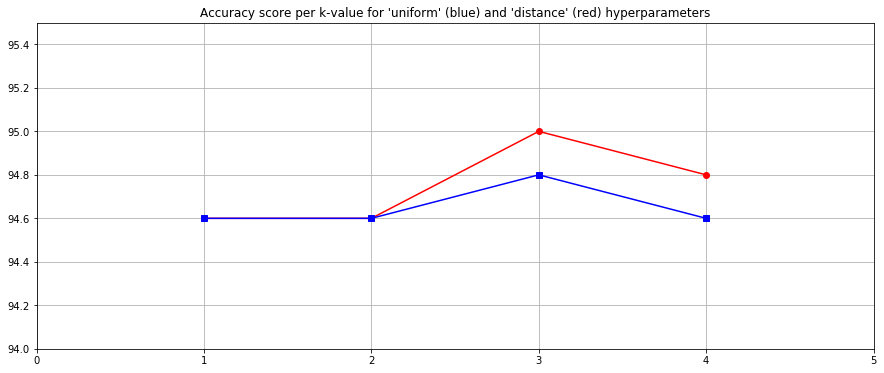

In [329]:
plt.figure(figsize=(15, 6))
plt.plot(test_values, distance_results, 'ro-', test_values, uniform_results, 'bs-')
plt.axis([0, test_range+1, 94, 95.5])
plt.grid()
plt.title("Accuracy score per k-value for 'uniform' (blue) and 'distance' (red) hyperparameters")
plt.show()

In [196]:
# notre métrique, avec 'deskewed' et 'postprocessing' (partial black background)
knn_clf = KNeighborsClassifier(n_neighbors=3,
                               metric=shifted_metric,
                               weights='distance')
knn_clf.fit(x_train_desk_bbg_2, y_train)
accuracy = knn_clf.score(x_test_desk_bbg_2, y_test) * 100
print("Accuracy =    ", accuracy, "%")

Accuracy =     95.0 %


On remarque qu'il y a bel et bien une gain de performance de **5.4%** grâce à notre métrique.

Cela n'est pas étonnant puisqu'avec ma métrique, un chiffre n'aura généralement que plus de chances de trouver un autre même chiffre parmi le jeu de donnée étant donné la translation incorporée dans la métrique. Cela a probablement rapproché certains chiffres qui n'étaient pas les bons, mais ceux qui étaient les bons ont fort probablement été rapprochés par une grande magnitude. Ainsi, pour un même hyperparamètre "k", il y a de plus grandes chances que la catégorisation se fasse correctement.

#### Tableau récapitulatif

| Metric | Preprocessing | k | weights  | accuracy |
| ------ | ------------- | - | -------- | -------- |
| L3     | None          | 3 | distance | 90.6 |
| cos    | None          | 3 | distance | 91.4 |
| **L2**     | **None**          | **3** | **distance** | **89.6** |
| L2     | PCA (58 comp) | 1 | *uniform*  | 94.2 |
| L2     | Binary        | 3 | distance | 86.8 |
| L2     | Deskewed      | 3 | distance | 94.4 |
| L2     | Desk + bbg1   | 3 | distance | 94.2 |
| L2     | Desk + bbg2   | 3 | distance | 94.4 |
| **SM**     | **None**          | **3** | **distance** | **92.6** |
| SM     | PCA (49 comp) | 2 | distance | 86.0 |
| SM     | Binary        | 3 | distance | 86.2 |
| SM     | Deskewed      | 3 | distance | 94.4 |
| SM     | Desk + bbg1   | 3 | distance | 94.8 |
| ***SM***     | ***Desk + bbg2***   | ***3*** | ***distance*** | ***95.0*** |

Gain total: **5.4%**

(Je ne présente là d'autres options que celles appliquées à notre propre métrique que parce que ces résultats ont tous déjà été présentés durant la présentation de notre phase d'exploration pour le *preprocessing*.)

## Clustering

Ces algorithmes cherchent à délimiter un espace qui pourrait correspondre à une zone d'éléments similaires entre eux. Dans le cadre de ce devoir, nous sommes chanceux: nous connaissons déjà le nombre de *clusters* à évaluer (soit **10**), mais de façon générale c'est une méthode non-supervisée.

En soit, il pourrait être intéressant d'essayer de créer plus de 10 *clusters* afin de créer des *clusters* de chiffres "trop semblables" qui pourraient diminuer la précision des autres *clusters*. Ainsi, peut-être nous retrouvrions-nous avec des *clusters* d'un mélange de chiffres "4" et "9" très mal délimité, mais qui permettrait possiblement à deux clusters beaucoup mieux délimités de "4" et de "9". Ultimement, on pourrait alors tenter d'identifier ce "*cluster* vague" (probablement à l'aide d'une matrice de contingence) et de le fusionner avec un autre cluster en fonction du nombre de chiffre le plus représenté dans celui-ci.

J'avais commencé à travailler sur une approche telle que décrite dans le précédent paragraphe, et les résultats étaient assez concluants, mais il fallait encore peaufiner l'algorithme pour réussir à ne pas accidentellement effacer complètement l'existence d'un *cluster* représentant un certain chiffre durant la fusion (en considérant que le nombre de chiffres le plus présent dans un *cluster* correspond à l'étiquette de ce dernier). J'ai cependant manqué de temps et j'ai donc abandonné cette approche en court de route.

De toute manière, le fait d'être dans un contexte "supervisé" de *clustering* donne accès à certaines méthodes d'évaluations de plus qui prennent en compte les *labels* connus. Néanmoins, les modèles de *clustering* sont plus complexes à évaluer et c'est pourquoi il a fallu coder cette série de méthodes:

In [241]:
# to remove irrelevant warnings coming from the sklearn.metrics
warnings.filterwarnings("ignore")

def compute_all_scores(x_train, y_train, labels_pred, distance_matrix):
    """
    Compute all of the scores provided.
    :param x_train: training data without the labels
    :param y_train: the ground_truth or target (the real labels)
    :param labels_pred: could be k_mean_labels
    :param distance_matrix: precomputed using custom metric
    :return: array with all of the scores
    """
    all_scores =\
        [
            silhouette_score(distance_matrix, labels_pred),
            calinski_harabaz_score(x_train, labels_pred),
            davies_bouldin_score(x_train, labels_pred),
            adjusted_rand_score(y_train, labels_pred),
            mutual_info_score(y_train, labels_pred),
            conditional_entropy_score(y_train, labels_pred),
            fowlkes_mallows_score(y_train, labels_pred)
        ]
    return all_scores


def bench_scores(name, computed_scores):
    """
    Pour obtenir l'argument d'affichage
    :param name: nom associé à la série de scores affichée
    :param computed_scores: l'objet retourné par la méthode "compute_all_scores"
    :return:
    """
    return (name,
            computed_scores[0],
            computed_scores[1],
            computed_scores[2],
            computed_scores[3],
            computed_scores[4][0],
            computed_scores[4][1],
            computed_scores[4][2],
            computed_scores[5][0],
            computed_scores[5][1],
            computed_scores[5][2],
            computed_scores[6])


def process_scores(name, x_train, y_train, labels, distance_matrix):
    """
    Pour obtenir les scores arrangés pour le tableau d'affichage récapitulatif
    :param name:
    :param x_train:
    :param y_train:
    :param labels:
    :param distance_matrix:
    :return:
    """
    return bench_scores(name, compute_all_scores(x_train, y_train, labels, distance_matrix))
    

def display_scores_table(*args):
    """
    Pour afficher le tableau des scores de l'application d'un algo
    :param args:
    :return:
    """
    print(104 * '_')
    print('type\t\tsilhou\tcalins\tdavies\trand\tmutual\tNMI\tAMI\thomo\tcompl\tv-meas\tfwolkes')
    for arg in args:
        print('%-9s\t%.4f\t%.2f\t%.4f\t%.4f\t%.4f\t%.4f\t%.4f\t%.4f\t%.4f\t%.4f\t%.4f'
          % arg)
    print(104 * '_')


def silhouette_score(distance_matrix, labels):
    """
    http://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score

    The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and
    the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for
    a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and
    the nearest cluster that the sample is not a part of.

    Bounds: [-1, 1]
    Perfect score: 1.0

    :param distance_matrix: precomputed distance metric (to be able to use custom metric)
    :param labels: labels assigned by k_mean
    :return: the score
    """
    score = metrics.silhouette_score(distance_matrix,
                                     labels,
                                     metric='precomputed')
    #print("--Silhouette (bounded -1 to 1, best is Higher):", score)
    return score


def calinski_harabaz_score(x_train, labels):
    """
    http://scikit-learn.org/stable/modules/clustering.html#calinski-harabaz-index
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.calinski_harabaz_score.html#sklearn.metrics.calinski_harabaz_score

    Also known as the Variance Ratio Criterion.
    The score is defined as ratio ratio of the between-clusters dispersion mean and the within-cluster dispersion.
    A higher score relates to a model with better defined clusters.

    Bounds: [?, ?]
    Perfect score: Higher

    :param x_train: data used for training (without labels)
    :param labels: labels assigned by k_mean
    :return: the score
    """
    score = metrics.calinski_harabaz_score(x_train, labels)
    #print("--Calinski-Harabaz (bounded None to None, best is Higher):", score)
    return score


def davies_bouldin_score(x_train, labels):
    """
    http://scikit-learn.org/stable/modules/clustering.html#davies-bouldin-index
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html#sklearn.metrics.davies_bouldin_score

    The index is defined as the average similarity between each cluster and its most similar one.
    A lower Davies-Bouldin index relates to a model with better separation between the clusters.

    Bounds: [0, None]
    Perfect score: 0.0  (LOWER!)

    :param x_train: data used for training (without labels)
    :param labels: labels assigned by k_mean
    :return: the score
    """
    score = metrics.davies_bouldin_score(x_train, labels)
    #print("--Davies-Bouldin Index (bounded 0 to None, best is Lower):", score)
    return score


def adjusted_rand_score(labels_true, labels_pred):
    """
    http://scikit-learn.org/stable/modules/clustering.html#adjusted-rand-index
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html#sklearn.metrics.adjusted_rand_score

    Measures the similarity of the two assignments, ignoring permutations and with chance normalization.

    Bounds: [-1, 1]
    Perfect score: 1.0
    """
    score = metrics.adjusted_rand_score(labels_true, labels_pred)
    #print("--Adjusted rand (bounded -1 to 1, best is Higher):", score)
    return score


def mutual_info_score(labels_true, labels_pred):
    """
    http://scikit-learn.org/stable/modules/clustering.html#mutual-information-based-scores
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.mutual_info_score.html#sklearn.metrics.mutual_info_score
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_mutual_info_score.html#sklearn.metrics.adjusted_mutual_info_score
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.normalized_mutual_info_score.html#sklearn.metrics.normalized_mutual_info_score

    Measures the agreement of the two assignments, ignoring permutations.
    Two different normalized versions of this measure are available,
    Normalized Mutual Information (NMI) and Adjusted Mutual Information (AMI).
    NMI is often used in the literature, while AMI was proposed more recently and is normalized against chance.

    Bounds: [None, 1]
    Perfect score: 1.0

    :return: the 3 scores
    """
    score1 = metrics.mutual_info_score(labels_true, labels_pred)
    score2 = metrics.normalized_mutual_info_score(labels_true, labels_pred)
    score3 = metrics.adjusted_mutual_info_score(labels_true, labels_pred)
    #print("--Mutual info, Normalized, Adjusted (bounded None to 1, best is Higher):", score1, score2, score3)
    return score1, score2, score3


def conditional_entropy_score(labels_true, labels_pred):
    """
    http://scikit-learn.org/stable/modules/clustering.html#homogeneity-completeness-and-v-measure
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.homogeneity_completeness_v_measure.html#sklearn.metrics.homogeneity_completeness_v_measure

    Homogeneity: each cluster contains only members of a single class.
    Completeness: all members of a given class are assigned to the same cluster.
    Their harmonic mean called V-measure.

    Bounds: [0, 1]
    Perfect score: 1.0

    :return: the 3 scores
    """
    score = metrics.homogeneity_completeness_v_measure(labels_true, labels_pred)
    #print("--Homogeneity, Completeness, V-measure (bounded 0 to 1, best is Higher):", score)
    return score


def fowlkes_mallows_score(labels_true, labels_pred):
    """
    http://scikit-learn.org/stable/modules/clustering.html#fowlkes-mallows-scores
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.fowlkes_mallows_score.html#sklearn.metrics.fowlkes_mallows_score

    The geometric mean of the pairwise precision and recall.

    Bounds: [0, 1]
    Perfect score: 1.0
    """
    score = metrics.fowlkes_mallows_score(labels_true, labels_pred)
    #print("--Fowlkes-Mallows (bounded 0 to 1, best is Higher):", score)
    return score

### K-Medoïde

Une version légèrement modifiée de ***k-moyenne***. Assume aussi une forme convexe des différents clusters de données et s'assure d'utiliser des données pour le recentrement périodique plutôt qu'un point dans l'espace.

In [344]:
# Pour pouvoir utiliser le code d'évaluation avec k-medoïdes
def extract_labels(table, length):
    to_return = [None]*length
    label = 0
    for region in table:
        for i in region:
            to_return[i] = label
        label += 1
    return to_return


def test_k_medoid(title, X, Y, matrix):
    initial_medoids = [1,4,6,8,3,0,14,16,18,5]
    kmedoids_instance = kmedoids(matrix,
                                 initial_medoids,
                                 data_type='distance_matrix')
    kmedoids_instance.process()

    # Extraction des données trouvées, données en INDEX dans 'X'
    clusters = kmedoids_instance.get_clusters()
    medoids  = kmedoids_instance.get_medoids()
    
    # Affiche les médoïdes finaux
    plt.figure(figsize=(20, 4))
    plt.suptitle("Representation of the medoids for " + title)
    tmp = 1
    for i in medoids:
        plt.subplot(2, 5, tmp)
        plt.imshow(np.reshape(X[i], (28, 28)), cmap='gray')
        plt.xticks([])
        plt.yticks([])
        tmp = tmp + 1
    plt.show()
    
    # Préparation des scores
    labels = np.asarray(extract_labels(clusters, len(X)))
    contingency_matrix(Y, labels)

    # Retourner les scores pour le tableau récapitulatif
    return process_scores(title, X, Y, labels, matrix)


def contingency_matrix(labels_true, labels_pred):
    """
    http://scikit-learn.org/stable/modules/clustering.html#contingency-matrix
    http://scikit-learn.org/stable/modules/generated/sklearn.metrics.cluster.contingency_matrix.html#sklearn.metrics.cluster.contingency_matrix

    reports the intersection cardinality for every true/predicted cluster pair.
    The contingency matrix provides sufficient statistics for all clustering metrics
    where the samples are independent and identically distributed and one doesn’t
    need to account for some instances not being clustered.


    Here is an example:

        x = ["a", "a", "a", "b", "b", "b"]
        y = [0, 0, 1, 1, 2, 2]
        contingency_matrix(x, y)

    RETURNS:
    array([[2, 1, 0],
           [0, 1, 2]])
    The first row of output array indicates that there are three samples whose true cluster is “a”.
    Of them, two are in predicted cluster 0, one is in 1, and none is in 2.
    And the second row indicates that there are three samples whose true cluster is “b”.
    Of them, none is in predicted cluster 0, one is in 1 and two are in 2.


    :return: contingency : {array-like, sparse}, shape=[n_classes_true, n_classes_pred].
    Matrix C such that C_i,j is the number of samples in true class i and in predicted class j.
    """
    matrix = metrics.cluster.contingency_matrix(labels_true, labels_pred)
    print("Contingency matrix (see doc):\n", matrix)

### k-medoïde (implémentation avec L2)

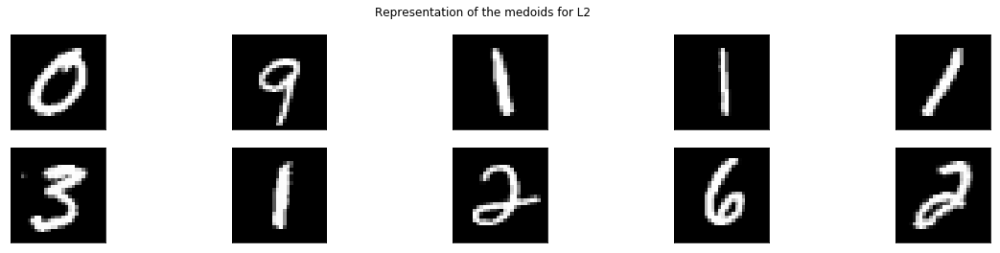

Contingency matrix (see doc):
 [[180   3   0  18   0   2   1   6  16   8]
 [  0   1  28  29 124   0  95   0   0   0]
 [  2  13   5  17  46   6  25  48   7  78]
 [  2  12  15  31   6 144  15   5   2   8]
 [  0 195   5  24  16   0  11  12  13   4]
 [  9  23  11  73   7  64  14   0  25   1]
 [  3   4   2  25   8   0  15   7 185   5]
 [  5 179   1  47  15   1  18   6   1   2]
 [  0  32  12  10  58  45  27   2   8  28]
 [  1 187   3   8  11   3  22   4   2   3]]


In [345]:
km_table_l2 = test_k_medoid("L2", x_train, y_train, l2_distance_matrix)

### k-medoïde (implémentations avec notre métrique)

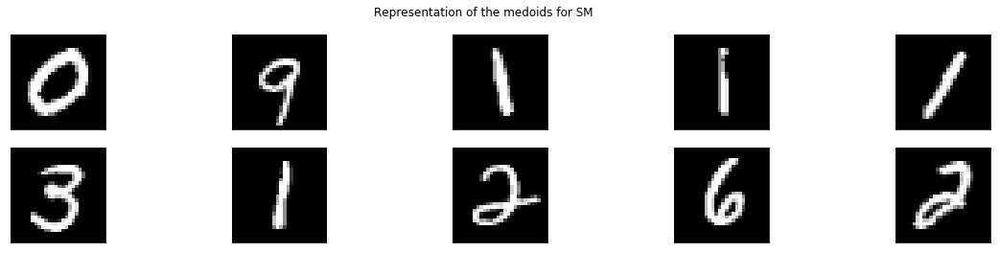

Contingency matrix (see doc):
 [[168   4   0  12   0   5   0   6  28  11]
 [  0   0  26  38 124   0  89   0   0   0]
 [  3  13   9  10  41   6  20  54   7  84]
 [  2  16  24  12   7 152   9   2   2  14]
 [  1 169   5  18  49   0  13  14   8   3]
 [  1  28  10  54   9  98   4   0  21   2]
 [  4   0   2  17  13   0  12   1 202   3]
 [  3 112   1  15 110   0  22   5   1   6]
 [  1  41  16  15  42  46  10   0  14  37]
 [  2 181   6   4  35   4   8   1   2   1]]


In [346]:
km_table_sm = test_k_medoid("SM", x_train, y_train, sm_distance_matrix)

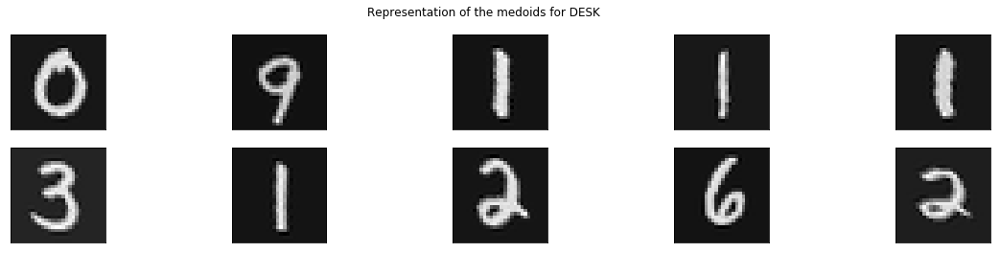

Contingency matrix (see doc):
 [[202   1   0   5   1   3   0   5  12   5]
 [  0   1  81  35  45   0 115   0   0   0]
 [  1   6   6  10  11  18   2 113   2  78]
 [  3   7   4  15   2 195   2   5   0   7]
 [  1 208   0  15  10   0  10   0   3  33]
 [ 17  71   1  16   2  76   0   0  32  12]
 [ 10   0   0   9   9   0   1   0 220   5]
 [  0 226   6   6   1   0   7   0   0  29]
 [  0  73   4   6  42  79   0   9   4   5]
 [  2 214   2   8   3   4   5   0   1   5]]


In [347]:
km_table_desk = test_k_medoid("DESK", x_train_deskewed, y_train, desk_distance_matrix)

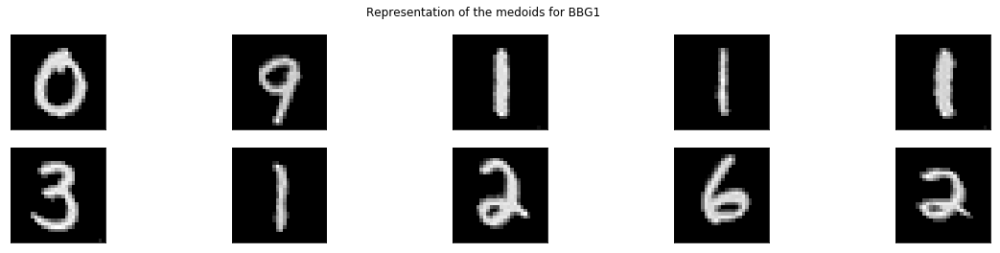

Contingency matrix (see doc):
 [[204   6   0   4   1   2   1   7   3   6]
 [  0   1 118  68  41   0  49   0   0   0]
 [  1   6   0   9   7  13  16 123   1  71]
 [  3   9   2   0   2 198  15   5   0   6]
 [  0 214   7  12   8   0   7   0   7  25]
 [ 19  80   2  12   3  79   2   0  18  12]
 [  8   0   0  17  13   0   1   0 213   2]
 [  0 230   0   2   1   0  18   0   1  23]
 [  0  85   5   3  38  68   2  14   5   2]
 [  2 214   2   2   2   4  13   0   0   5]]


In [348]:
km_table_bbg1 = test_k_medoid("BBG1", x_train_desk_bbg, y_train, bbg1_distance_matrix)

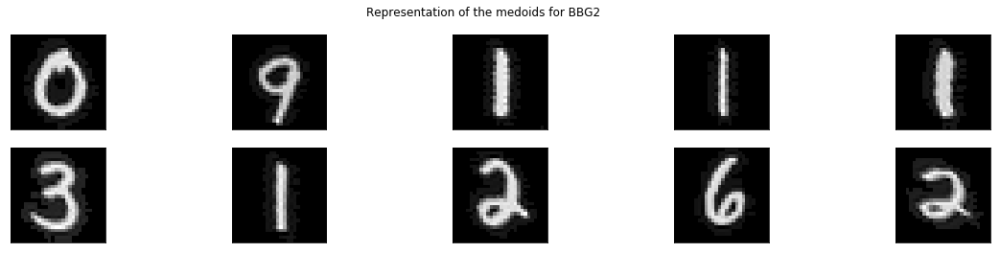

Contingency matrix (see doc):
 [[206   1   0   1   1   3   0   5  11   6]
 [  0   1  81  50  41   0 104   0   0   0]
 [  1   3   3   8  11  21   4 118   2  76]
 [  3   9   4   2   2 204   8   3   0   5]
 [  1 215   1   3  10   0  16   0   3  31]
 [ 16  74   1   4   4  74   2   0  39  13]
 [ 10   0   0   4   8   0   3   0 223   6]
 [  0 232   3   3   1   0  12   0   0  24]
 [  0  72   3   1  40  84   2   9   5   6]
 [  2 218   2   2   3   4   8   0   1   4]]


In [349]:
km_table_bbg2 = test_k_medoid("BBG2", x_train_desk_bbg_2, y_train, bbg2_distance_matrix)

#### Tableau récapitulatif et analyse:

In [350]:
# Afficher le tableau récapitulatif
display_scores_table(km_table_l2, km_table_sm, km_table_desk, km_table_bbg1, km_table_bbg2)

________________________________________________________________________________________________________
type		silhou	calins	davies	rand	mutual	NMI	AMI	homo	compl	v-meas	fwolkes
L2       	0.0502	76.85	3.2941	0.2590	0.8030	0.3620	0.3445	0.3492	0.3752	0.3617	0.3489
SM       	0.0468	72.42	3.4743	0.2491	0.8109	0.3648	0.3480	0.3527	0.3774	0.3646	0.3381
DESK     	0.0517	112.48	2.8820	0.3217	1.0485	0.4824	0.4521	0.4560	0.5104	0.4817	0.4190
BBG1     	0.0572	114.66	3.1600	0.3163	1.0514	0.4853	0.4533	0.4572	0.5152	0.4845	0.4174
BBG2     	0.0583	119.90	3.0842	0.3279	1.0671	0.4945	0.4602	0.4641	0.5269	0.4935	0.4279
________________________________________________________________________________________________________


En plus du tableau récapitulatif, il est possible de jeter un regard aux *matrices de contingence* présentées plus haut afin d'avoir une idée plus précise de ce que *contiennent* les *clusters* en fonction des *labels*, mais je ne vais pas m'attarder à une telle analyse. Cependant, on remarque qu'il y a des *clusters* qui ne contiennent quasiment aucun éléments, alors que d'autres contiennent une très grande quantité de différents "chiffre-MNIST". Il serait probablement possible de jouer avec le tableau d'initialisation des médoïdes pour optimiser les scores obtenus, mais quand tracer la ligne entre la recherche et le *cherry picking*? J'ai tout simplement pris un des premiers chiffres de chaque catégorie dans x_train comme point de départ.

Pour le tableau, il faut savoir qu'à part pour la colonne de "*davies*", on cherche à **maximiser** les valeurs. Ainsi, **BBG2 l'emporte sur tout le reste**, sauf pour le score de *davies* où il est en 2e position, après DESK.

En terme d'interprétabilité immédiate et intuitive, portons notre attention sur les scores d'entropie conditionnelle, qui varient entre 0 et 1, et dont le score parfait est de 1. Ces définitions proviennent de *sklearn*:

* *Homogeneity* ("homo"): Each cluster contains only members of a single class.
* *Completeness* ("compl"): All members of a given class are assigned to the same cluster.

Le gain pour **BBG2** (versus L2) est de **11.49% pour "homo"** et de **15.17% pour "compl"**. Cependant, une bien meilleure évaluation aurait été obtenue en faisant une moyenne sur plusieurs choix de centroïdes d'initialisation. Parmi nos tests (qui ne sont pas montrés ici) qui choisissaient des initialisations aléatoires de centroïdes, la relation de performance était conservée: BBG2 restait le plus performant.

Si vous désirez interpréter le reste des scores, j'ai fourni un résumé de la documentation de *sklearn* plus haut, dans le premier bloc de code de la section "*Clustering*".

### Partition binaire

La partition binaire regroupe de manière itérative les données. Cette partition est parfois représentée sous forme d'arbre ou de "dendogramme".

Les feuilles de l'arbre sont des exemplaires uniques qui sont alors "fusionnés" en un groupe en fonction de leur distance (la plus petite distance est toujours celle qui désigne les deux éléments à fusionner). Chaque fusion de deux éléments devient le nouvel élément à traiter par rapport aux autres.

La manière de considérer la comparaison entre des éléments "composés" (c'est-à-dire des regroupements) diffère selon la variante de l'algorithme utilisée. Dans le cadre de ce devoir, j'utilise la variante basée sur la moyenne des distances. Cela veut dire que si 2 exemplaires ont été regroupés ensemble, l'algorithme oublie alors les 2 exemplaires et ne considère désormais que le regroupement comme étant un "exemplaire" dont la position dans l'espace est déterminée par la moyenne des distances entre ses 2 exemplaires qui le composent.

In [279]:
def test_bin_part(title, X, Y, matrix):
    # sk_HC:  http://scikit-learn.org/stable/modules/clustering.html#hierarchical-clustering
    clustering = AgglomerativeClustering(affinity='precomputed',
                                         compute_full_tree='auto',
                                         connectivity=None,
                                         linkage='average',  # basé sur la moyenne des distances
                                         memory=None,
                                         n_clusters=10)
    
    # Obtain labels of the clusters
    labels = clustering.fit_predict(matrix)
    
    # Retourner les scores pour le tableau récapitulatif
    return process_scores(title, X, Y, labels, matrix)

### Partition binaire (implémentation avec L2)

In [276]:
bp_table_l2 = test_bin_part("L2", x_train, y_train, l2_distance_matrix)

### Partition binaire (implémentations avec notre métrique)

In [277]:
bp_table_sm   = test_bin_part("SM", x_train, y_train, sm_distance_matrix)
bp_table_desk = test_bin_part("DESK", x_train_deskewed, y_train, desk_distance_matrix)
bp_table_bbg1 = test_bin_part("BBG1", x_train_desk_bbg, y_train, bbg1_distance_matrix)
bp_table_bbg2 = test_bin_part("BBG2", x_train_desk_bbg_2, y_train, bbg2_distance_matrix)

#### Tableau récapitulatif et analyse:

In [278]:
# Afficher le tableau récapitulatif
display_scores_table(bp_table_l2, bp_table_sm, bp_table_desk, bp_table_bbg1, bp_table_bbg2)

________________________________________________________________________________________________________
type		silhou	calins	davies	rand	mutual	NMI	AMI	homo	compl	v-meas	fwolkes
L2       	0.0468	35.90	2.3760	0.0641	0.4948	0.3369	0.2095	0.2152	0.5274	0.3056	0.3220
SM       	0.0467	30.22	2.2360	0.0442	0.3618	0.2707	0.1515	0.1574	0.4656	0.2352	0.3113
DESK     	0.0691	37.81	1.9843	0.0757	0.4725	0.3531	0.2001	0.2055	0.6069	0.3070	0.3420
BBG1     	0.0774	40.66	2.1310	0.0818	0.5102	0.3718	0.2161	0.2219	0.6231	0.3272	0.3460
BBG2     	0.0779	38.93	1.8710	0.0756	0.4750	0.3624	0.2014	0.2066	0.6359	0.3118	0.3452
________________________________________________________________________________________________________


Ce tableau n'est pas aussi facile à interpréter puisque ce n'est pas systématiquement BBG2 qui l'emporte sur tout les autres. Voici une version avec emphase sur les "gagnants":

|Metric		|silhou	|calins	|davies	|rand	|mutual	|NMI	|AMI	|homo	|compl	|v-meas	|fwolkes|
| --------- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- | ----- |
|L2       	|0.0468	|35.90	|2.3760	|0.0641	|0.4948	|0.3369	|0.2095	|0.2152	|0.5274	|0.3056	|0.3220|
|SM       	|0.0467	|30.22	|2.2360	|0.0442	|0.3618	|0.2707	|0.1515	|0.1574	|0.4656	|0.2352	|0.3113|
|DESK     	|0.0691	|37.81	|1.9843	|0.0757	|0.4725	|0.3531	|0.2001	|0.2055	|0.6069	|0.3070	|0.3420|
|BBG1     	|0.0774	|**40.66**	|2.1310	|**0.0818**	|**0.5102**	|**0.3718**	|**0.2161**	|**0.2219**	|0.6231	|**0.3272**	|**0.3460**|
|BBG2     	|**0.0779**	|38.93	|**1.8710**	|0.0756	|*0.4750*	|0.3624	|*0.2014*	|*0.2066*	|**0.6359**	|0.3118	|0.3452|

On remarque que cette fois-ci, BBG1 est le grand vainqueur par rapport à L2 (pour *tous* les scores). Il semblerait que d'avoir des fonds noirs uniformément aide beaucoup cet algorithme à regrouper correctement.

Néanmoins BBG2 se défend très bien contre L2: il sous-performe uniquement pour **mutual**, **AMI** et **homo**. Ces deux premiers scores proviennent de la même catégorie, décrite par *sklearn* ainsi:

* *Mutual information* ("mutual"): Measures the agreement of the two assignments, ignoring permutations.
* *Adjusted mutual information* ("AMI"): Correponds to 'mutual information', but normalized against chance.

Pour KNN, BBG2 semblait mieux performer car il conservait une information partielle par rapport aux "formes" des chiffres (une extension, ou renforcement de ces formes courbes et lignes extérieures via une intensité non-nulle facilitait probablement la classification par comparaisons une-à-une). De plus, j'ai remarqué que l'intensité du bruit introduit par le *deskewing* n'était pas la même pour tous les exemplaires. Je n'ai pas fait plus de recherches que cela, mais je soupçonne qu'il pourrait y avoir une relation entre la quantité de cette intensité-de-bruit et le chiffre traité: ce serait donc deux informations supplémentaires introduites par BBG2 dans chaque image.

Considérant que j'utilise la version de la partition binaire qui se base sur la moyenne des distances pour représenter les "*clusters* intermédiaires", peut-être pourrais-je justifier cette perte de performance de BBG2: ces deux informations que l'on pense qui ont été introduites et aidaient à la classification sont alors "flouées" par la moyenne itérative et impactes en fait négativement l'interprétation. Ainsi, BBG1, qui ne conservait que le *deskewing* "ajusté", se "propage significativement" probablement mieux de manière itérative.

## Réduction de dimentionalité

La réduction de dimentionalité a plusieurs utilités. Entre autres:

* Compression
* Possibilité de diminution du sur-apprentissage
* Visualisation
* Diminuer l'effet du "*curse of dimentionality*"

Dans le cadre de ce devoir, les deux algorithmes qui suivent seront utilisés à des fins de visualisation en 2D, tel que précisé par un des deux démonstrateurs, et l'analyse de ces algorithmes se fera donc de manière qualitative. Considérant qu'une telle analyse peut être qualifiée de subjective à un certain degré, je ne vais pas présenter de phase exploratoire sur les hyperparamètres, mais plutôt un choix unique d'hyperparamètres.

De plus, puisque "officiellement" BBG est la version que je présente de manière générale dans le cadre du devoir, je ne vais faire que des analyses entre BBG1 et BBG2, pour ensuite comparer L2 avec le meilleur des deux. De manière générale, cette comparaison entre BBG1 et BBG2 n'est restée que par curiosité parce que j'étais assez surpris de voir que de n'enlever que partiellement le bruit intégré par le *deskewing* donnait généralement lieu à de meilleurs performances.

Les méthodes qui suivent vont servir pour les visualisations:

In [309]:
# from  http://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html#sphx-glr-auto-examples-manifold-plot-lle-digits-py

def plot_2D_embedding(reduced_data, y_train, title=None):
    """
    # Authors: Fabian Pedregosa <fabian.pedregosa@inria.fr>
    #          Olivier Grisel <olivier.grisel@ensta.org>
    #          Mathieu Blondel <mathieu@mblondel.org>
    #          Gael Varoquaux
    # License: BSD 3 clause (C) INRIA 2011

    Scale and visualize the embedding vectors.

    :param y_train: labels of the data used for training
    :param reduced_data: data that fitted to 2D
    :param title: title of the graph
    :return:
    """
    x_min, x_max = np.min(reduced_data, 0), np.max(reduced_data, 0)
    reduced_data = (reduced_data - x_min) / (x_max - x_min)

    plt.figure(figsize=(14, 14))
    ax = plt.subplot(111)
    for i in range(reduced_data.shape[0]):
        plt.text(reduced_data[i, 0], reduced_data[i, 1], str(y_train[i]),
                 color=plt.cm.Set1(y_train[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 12})

    if title is not None:
        plt.title(title)
    
    plt.xticks([]), plt.yticks([])
    plt.show()
    
    
def two_plots_2D_embedding(reduced_data1, reduced_data2, y_train, title1=None, title2=None):
    x_min1, x_max1 = np.min(reduced_data1, 0), np.max(reduced_data1, 0)
    reduced_data1 = (reduced_data1 - x_min1) / (x_max1 - x_min1)

    x_min2, x_max2 = np.min(reduced_data2, 0), np.max(reduced_data2, 0)
    reduced_data2 = (reduced_data2 - x_min2) / (x_max2 - x_min2)
    
    
    plt.figure(figsize=(14, 5))
    plt.suptitle("Comparaison des réductions")
    
    plt.subplot(1, 2, 1)
    if title1 is not None:
        plt.title(title1)
    for i in range(reduced_data1.shape[0]):
        plt.text(reduced_data1[i, 0], reduced_data1[i, 1], str(y_train[i]),
                 color=plt.cm.Set1(y_train[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})
        
    plt.subplot(1, 2, 2)
    if title2 is not None:
        plt.title(title2)
    for i in range(reduced_data2.shape[0]):
        plt.text(reduced_data2[i, 0], reduced_data2[i, 1], str(y_train[i]),
                 color=plt.cm.Set1(y_train[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})

    plt.show()
    

# adapted from  https://gist.github.com/amueller/4299381
def create_2d_pairwise_plot(x_transform):
    fig, plots = plt.subplots(10, 10, sharex=True, sharey=True)
    fig.set_size_inches(50, 50)
    plt.prism()
    plt.suptitle("Comparaison par paires", fontsize=50)

    for i, j in product(range(10), repeat=2):
        x_ = x_transform[(y_train == i) + (y_train == j)]
        y_ = y_train[(y_train == i) + (y_train == j)]

        plots[i, j].scatter(x_[:, 0], x_[:, 1], c=y_)
        plots[i, j].set_xticks(())
        plots[i, j].set_yticks(())

        plots[j, i].scatter(x_[:, 0], x_[:, 1], c=y_)
        plots[j, i].set_xticks(())
        plots[j, i].set_yticks(())

        if i == 0:
            plots[i, j].set_title(j, fontsize=48)
            plots[j, i].set_ylabel(j, fontsize=48)
    plt.show()

### MDS (PCoA)

Utilisé lorsqu'on cherche à réduire le nombre de dimensions tout en conservant le plus que possible les distances entre les données originales (comparément à PCA qui cherche plutôt à s'assurer que l'erreur de reconstruction est minimisée). C'est une technique utilisée, entre autres, pour tenter de visualiser les similarités entre différentes données.

In [315]:
def test_mds(X, matrix):
    t0 = time()
    # sk_MDS   http://scikit-learn.org/stable/modules/manifold.html#multi-dimensional-scaling-mds
    # params   http://scikit-learn.org/stable/modules/generated/sklearn.manifold.MDS.html
    clf = manifold.MDS(n_components=2,
                       n_init=1,
                       max_iter=100,
                       n_jobs=-1,
                       random_state=1,
                       dissimilarity='precomputed')
    X_mds = clf.fit_transform(matrix)  # (2500, 2) = 2500 images à 2 dimensions

    plot_2D_embedding(X_mds, y_train, "PCoA projection (time %.2fs)" % (time() - t0))
    
    return X_mds

### MDS (implémentation avec L2)

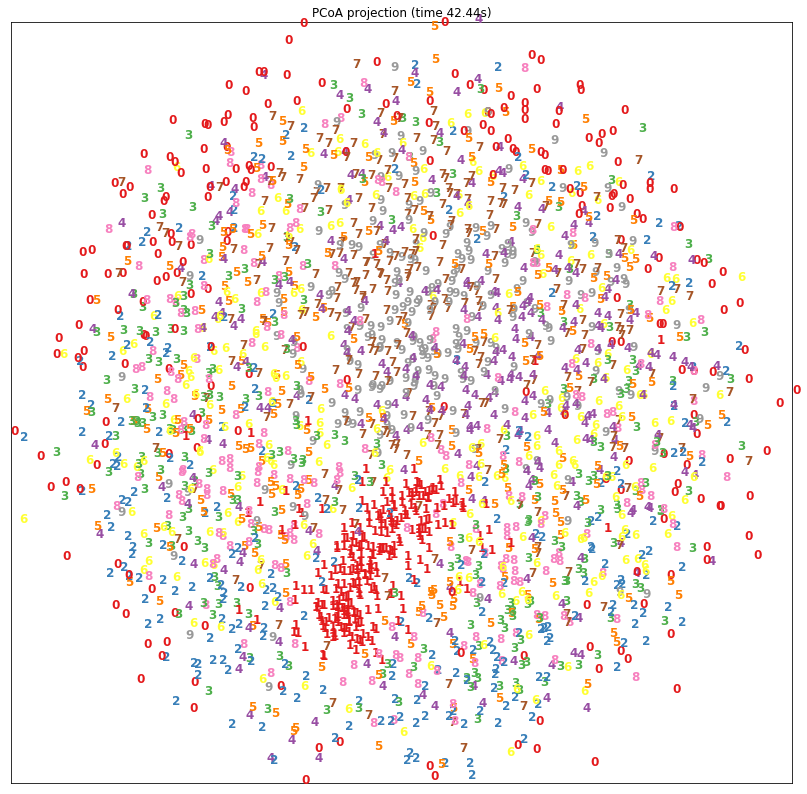

In [316]:
L2_mds = test_mds(x_train, l2_distance_matrix)

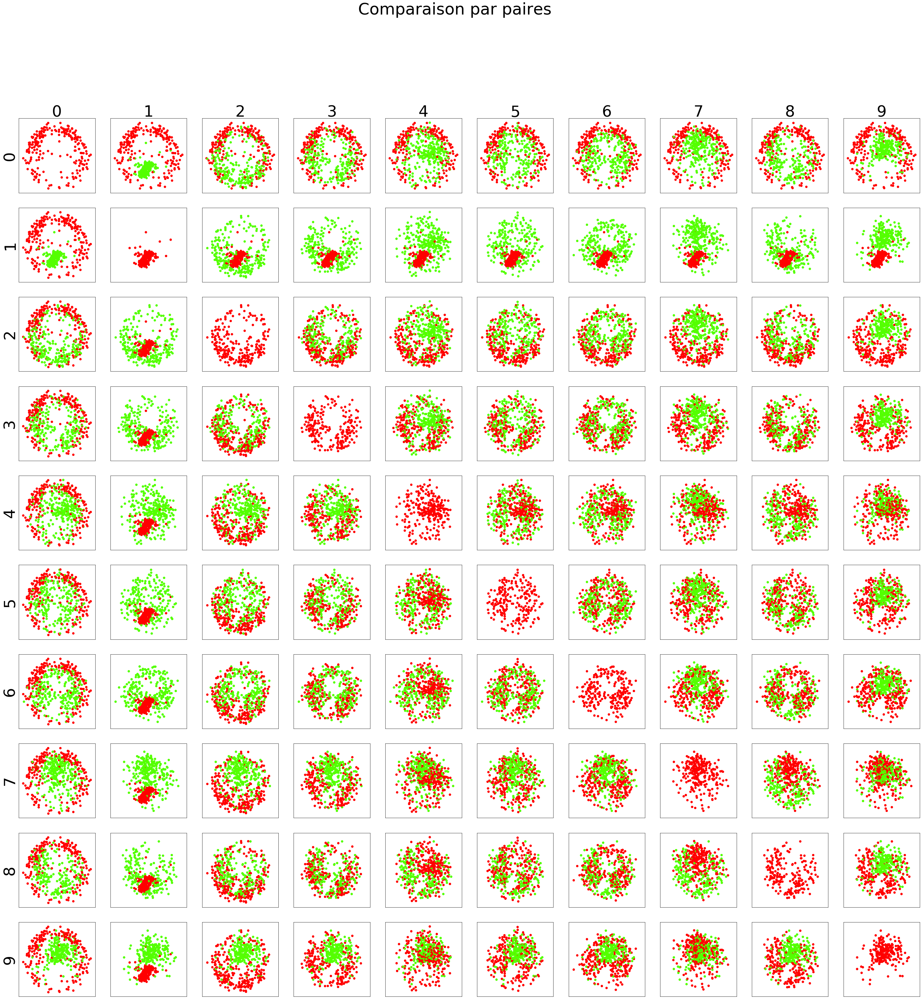

In [317]:
create_2d_pairwise_plot(L2_mds)

On remarque que les "1" sont très bien définis, comparément au reste des regroupements. Cela est possiblement dû au fait que c'est le seul chiffre qui n'est composé que d'une unique composante rectiligne: son écriture manuscrite ne varie donc pas de la même manière que les autres chiffres. Il sera intéressant de voir comment celui-ci se comporte avec BBG puisque les variations d'inclinaisons sont alors écartées.

### MDS (implémentation avec notre métrique)

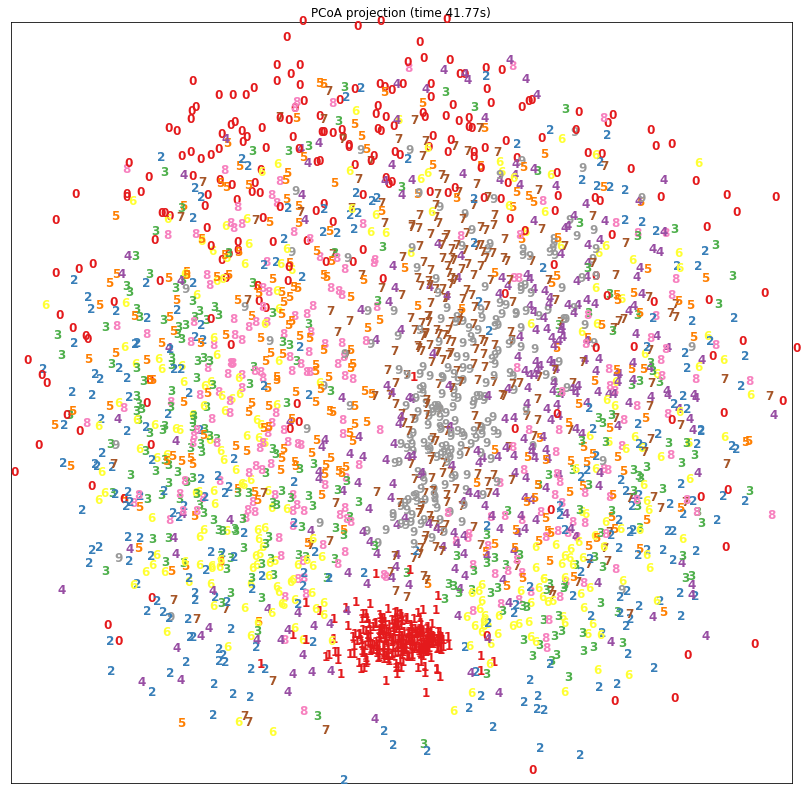

In [319]:
bbg1_mds = test_mds(x_train_desk_bbg, bbg1_distance_matrix)

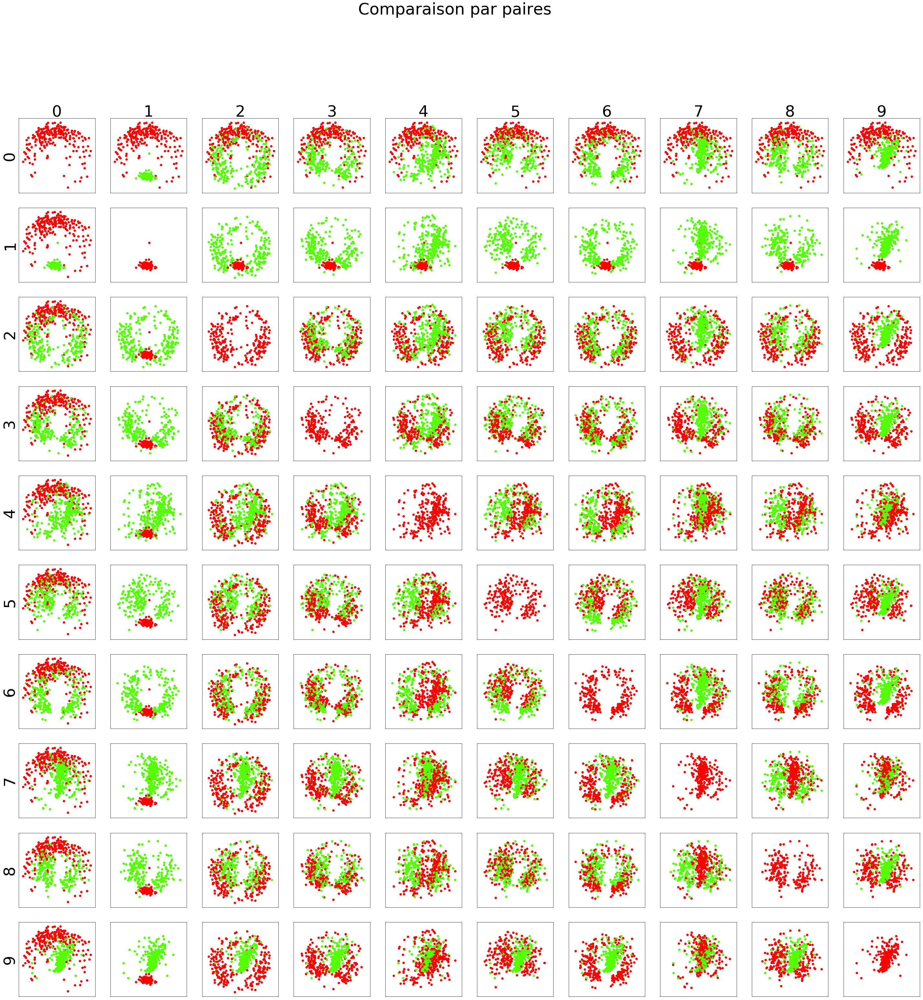

In [320]:
create_2d_pairwise_plot(bbg1_mds)

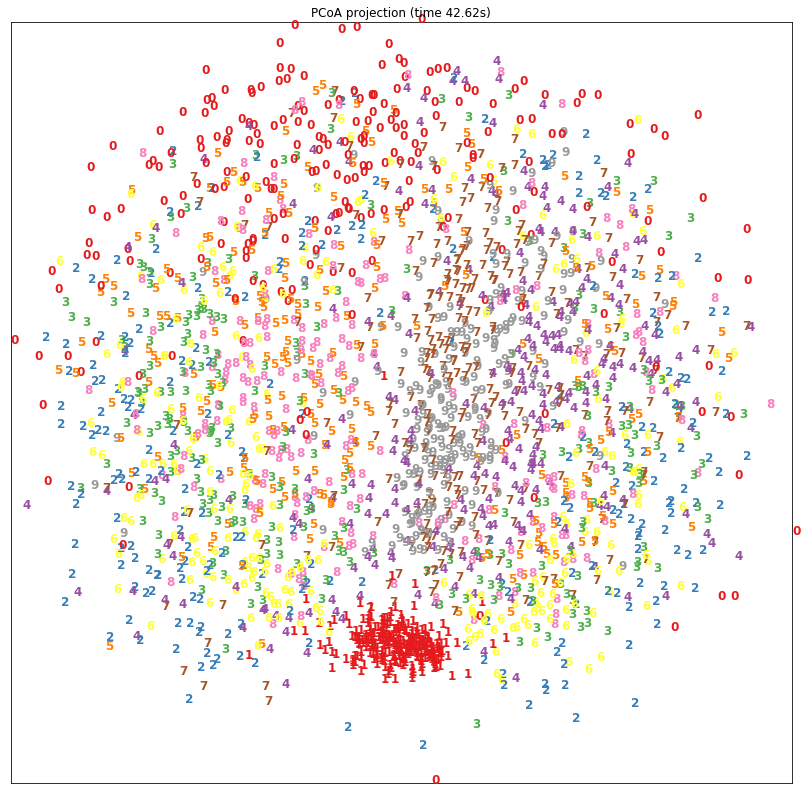

In [321]:
bbg2_mds = test_mds(x_train_desk_bbg_2, bbg2_distance_matrix)

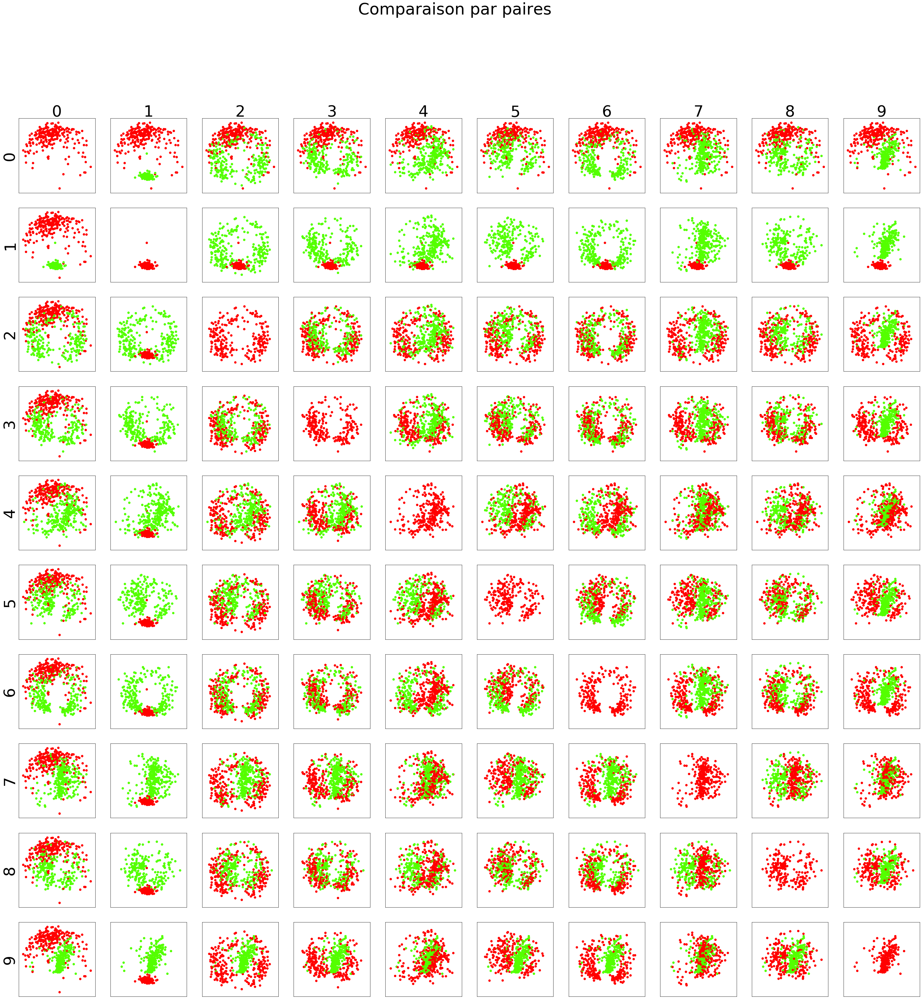

In [322]:
create_2d_pairwise_plot(bbg2_mds)

### Comparaisons

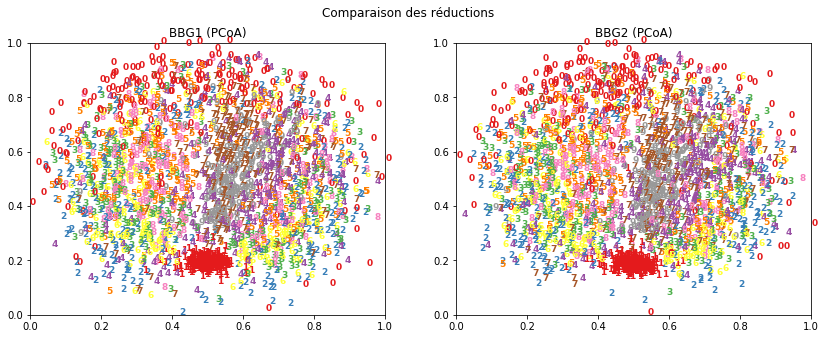

In [323]:
two_plots_2D_embedding(bbg1_mds, bbg2_mds, y_train, title1="BBG1 (PCoA)", title2="BBG2 (PCoA)")

Les deux approches donnent des résultats extrêmement semblables. Il ne vaut pas la peine de tenter de discerner des différences.

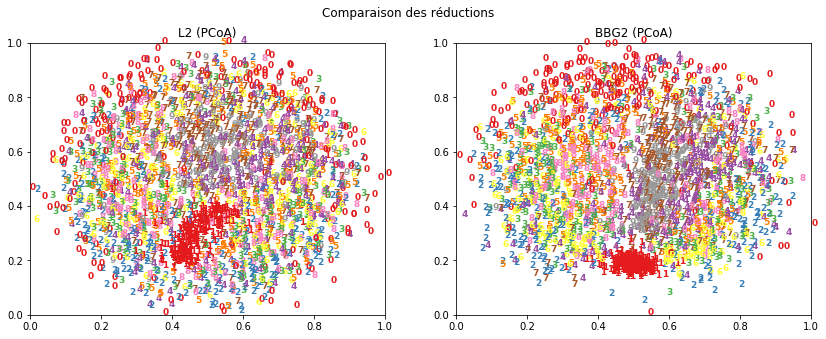

In [325]:
two_plots_2D_embedding(L2_mds, bbg2_mds, y_train, title1="L2 (PCoA)", title2="BBG2 (PCoA)")

Comme on si attendait, les "1" sont encore mieux définis avec BBG.

Peut-être y a-t-il beaucoup de "0" relativement inclinés dans nos exemplaires ce qui pourrait justifier leur concentration plus marquée vers le haut suite à l'utilisation de BBG?

En soit, la majorité des chiffres sont mieux "définis" par BBG dans le sens que leur regroupement est plus dense (ou moins éparpillé). Il est cependant difficile d'offrir une analyse plus approfondie sur une tel résultat de comparaison.

Ayant eu plus de temps, il aurait été intéressant de pouvoir comparer ces résultats avec une application de ma métrique secondaire "**cnn_metric_v3**".

### ISOMAP

ISOMAP assume que pour se rendre d'un point à un autre, on ne peut pas simplement y aller "à vol d'oiseau": il faut passer par un réseau de points intermédiaires.

La matrice des distances est donc obtenue à l'aide d'un algorithme de plus-proches-voisins afin de commencer à "tisser le réseau". La distance entre un point et tous les points qui ne sont pas rejoints par cet algorithme sont alors considérés comme étant à une distance infinie du point considéré. Ces "trous" dans la matrice des distances sont ensuite calculés à l'aide d'un algorithme de plus-court-chemin qui passera alors par le réseau de plus-proche-voisin créé plus tôt. Ainsi, s'il fallait passer par 3 noeuds intermédiaires pour se déplacer de ***i*** à ***j***, dans la matrice de distances, à la position ***(i,j)***, il y aura la somme des distances qu'il fallait parcourir pour passer par les 3 noeuds intermédiaires pour se rendre à ***j***.

Une fois cette matrice obtenue, il s'agit de simplement appliquer MDS sur celle-ci.

### ISOMAP (implémentation avec L2)

Reconstruction error (L2, k=2): 57836860.15498316


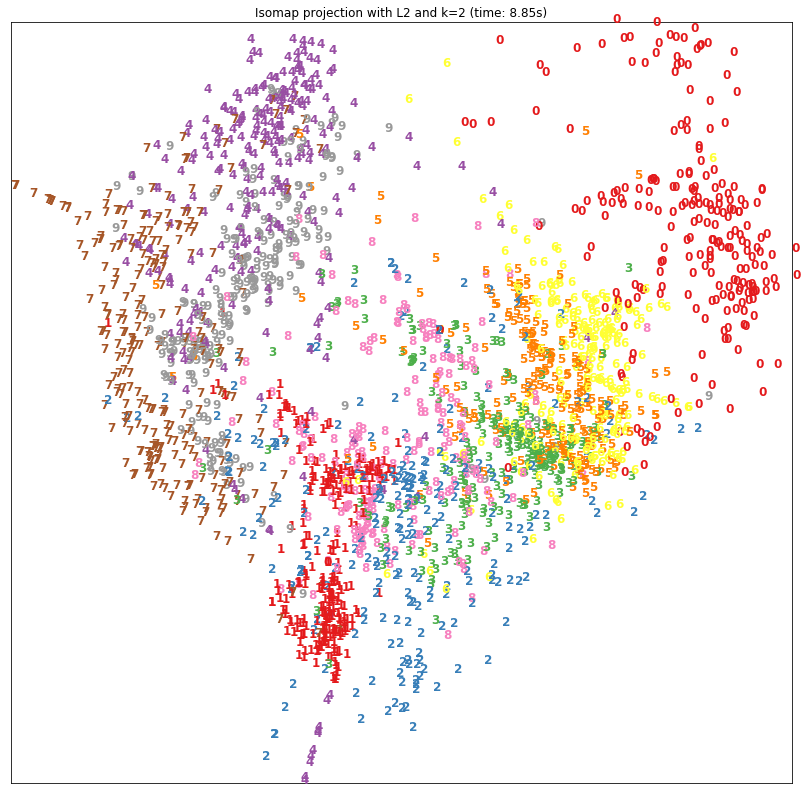

In [287]:
t0 = time()
# sk_ISOMAP  http://scikit-learn.org/stable/modules/manifold.html#isomap
# params     http://scikit-learn.org/stable/modules/generated/sklearn.manifold.Isomap.html#sklearn.manifold.Isomap
clf = manifold.Isomap(n_neighbors=2,
                      n_components=2,
                      n_jobs=-1)
L2_iso = clf.fit_transform(x_train)  # (2500, 2) = 2500 images à 2 dimensions
plot_2D_embedding(L2_iso, y_train, "Isomap projection with L2 and k=2 (time: %.2fs)" % (time() - t0))

De manière générale, on remarque que les "1" forment un regroupement assez serré, que les "0" sont relativement isolés et que les "7" réussissent tout de même à se définir une certain densité isolée des "4" et des "9" (malgré le *overlap* que l'on observe quand même).

Observons plutôt un graphe représentant le positionnement de toutes les paires de chiffres:

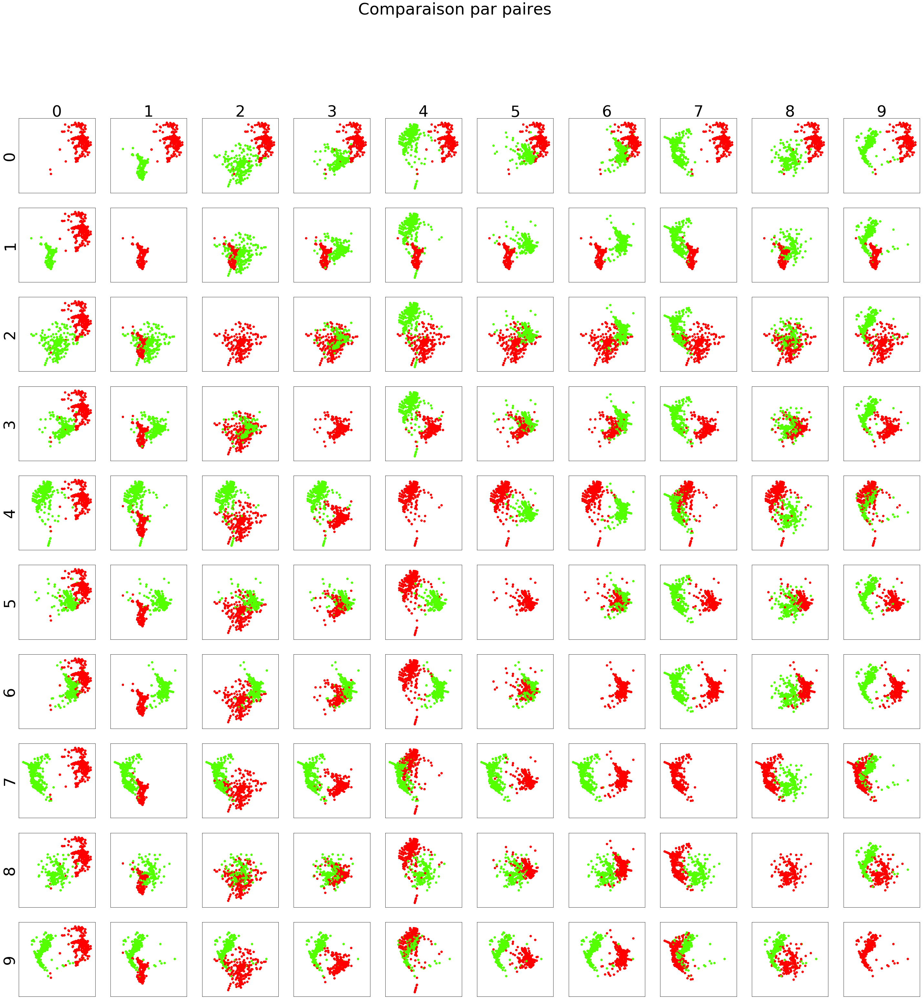

In [290]:
create_2d_pairwise_plot(L2_iso)

### ISOMAP (implémentations avec notre métrique)

Puisque *sklearn* ne semble pas permettre d'utiliser une fonction "custom" pour calculer les distances, il a fallu coder un calcul de la matrice de distances moi-même, en suivant les étapes décrites plus haut:

In [295]:
class CustomIsomap:

    def __init__(self,
                 dist_matrix,
                 k_neighbors=2):
        
        # attributes
        self.k_neighbors = k_neighbors
        self.dist_matrix = dist_matrix.copy()  # copy of precomputed matrix


    def fitData(self, data):
        maxi = np.max(self.dist_matrix)
        
        # keep only k nearest neighbors
        self.dist_matrix = np.apply_along_axis(replace_with_large, 1, self.dist_matrix, self.k_neighbors, 1000*maxi)

        # measure shortest paths
        self.dist_matrix = dijkstra(self.dist_matrix, directed=False)

def replace_with_large(x, k, maxi):
    k = (len(x) - k) - 1
    ind = np.argpartition(x, -k)[-k:]
    mask = np.ones_like(x, dtype=bool)
    mask[ind] = False
    x[~mask] = maxi
    return x

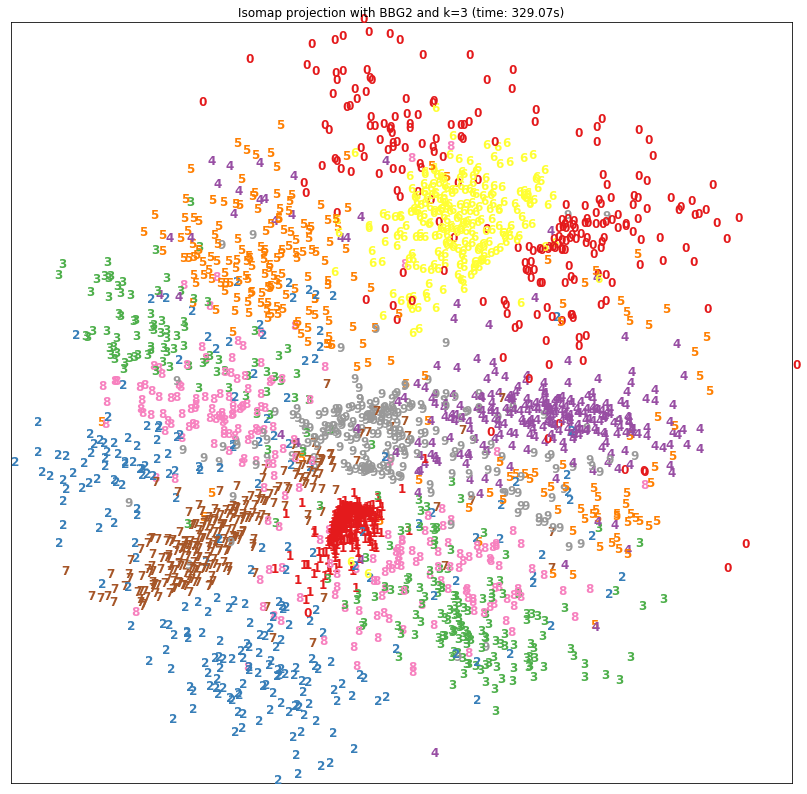

In [298]:
t0 = time()

clf = manifold.MDS(n_components=2,
                   n_init=1,
                   max_iter=100,
                   n_jobs=-1,
                   random_state=1,
                   dissimilarity='precomputed')

iso = CustomIsomap(k_neighbors=3, dist_matrix=bbg2_distance_matrix)
iso.fitData(x_train_desk_bbg_2)

bbg2_iso = clf.fit_transform(iso.dist_matrix)  # (2500, 2) = 2500 images à 2 dimensions

plot_2D_embedding(bbg2_iso, y_train, "Isomap projection with BBG2 and k=3 (time: %.2fs)" % (time() - t0))

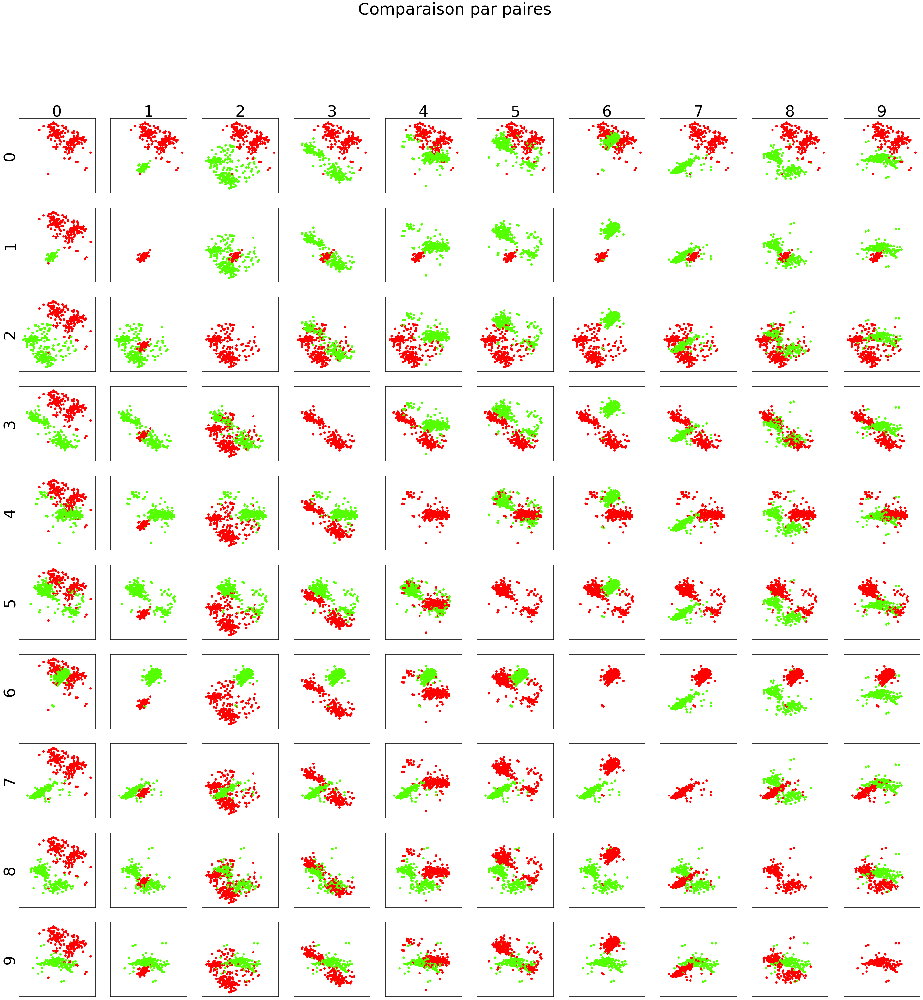

In [299]:
create_2d_pairwise_plot(bbg2_iso)

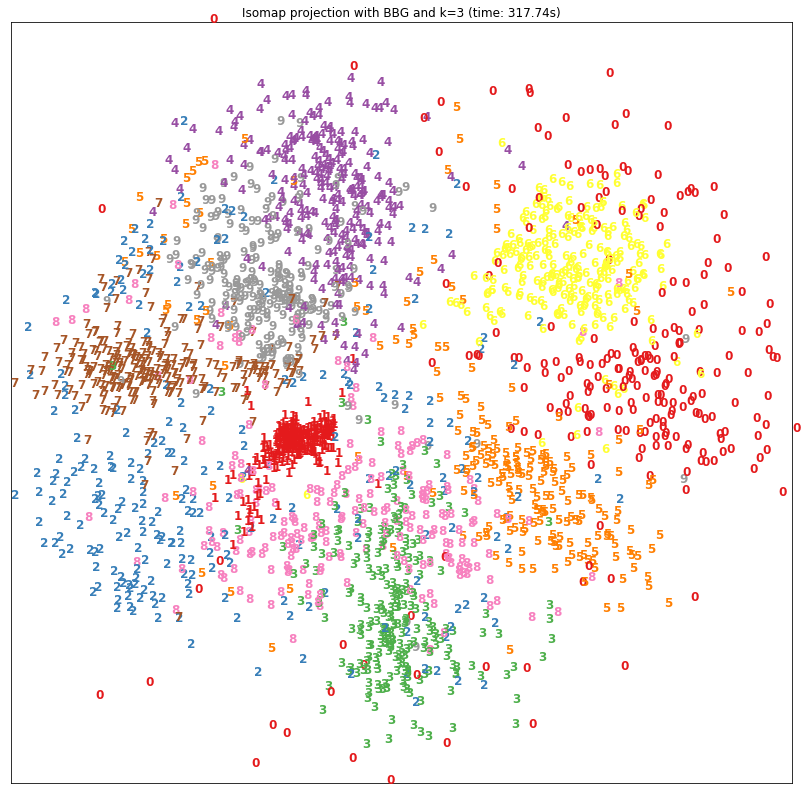

In [301]:
t0 = time()

clf = manifold.MDS(n_components=2,
                   n_init=1,
                   max_iter=100,
                   n_jobs=-1,
                   random_state=1,
                   dissimilarity='precomputed')

iso = CustomIsomap(k_neighbors=3, dist_matrix=bbg1_distance_matrix)
iso.fitData(x_train_desk_bbg)

bbg_iso = clf.fit_transform(iso.dist_matrix)  # (2500, 2) = 2500 images à 2 dimensions

plot_2D_embedding(bbg_iso, y_train, "Isomap projection with BBG and k=3 (time: %.2fs)" % (time() - t0))

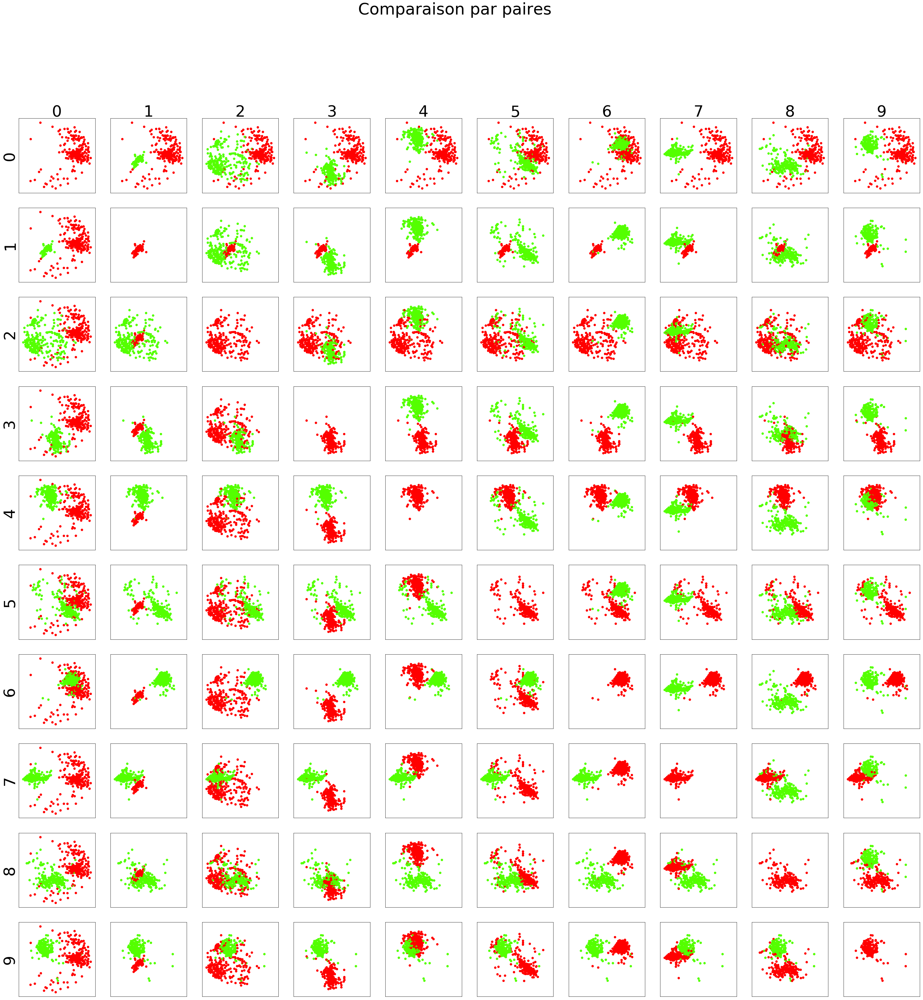

In [302]:
create_2d_pairwise_plot(bbg_iso)

### Comparaisons

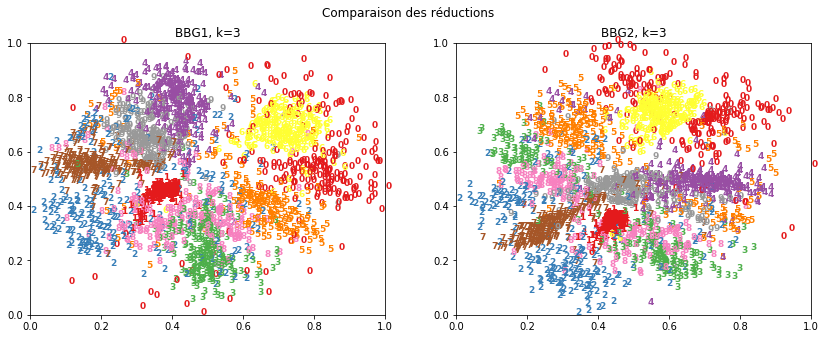

In [307]:
two_plots_2D_embedding(bbg_iso, bbg2_iso, y_train, title1="BBG1, k=3", title2="BBG2, k=3")

BBG2 semble permettre une meilleure séparation des regroupements. On remarque que BBG1 a dispersé certains "0" un peu partout alors qu'ils sont plus concentrés pour BBG2. De plus, BBG2 a rassemblé plus de "9" vers le centre et semble créer une meilleure distinction entre ceux-ci et les "4". BBG2 paraît aussi fournir une meilleure séparation entre les "2" et les "7". Finalement, BBG2 a un regroupement plus dense de "1".

Cependant, BBG1 a un meilleur regroupement des "3" ce qui créerait moins de confusion pour les distinguer des "8".

En général, il semblerait que **BBG2 offre une meilleure visualisation**.

Comparons désormais avec L2:

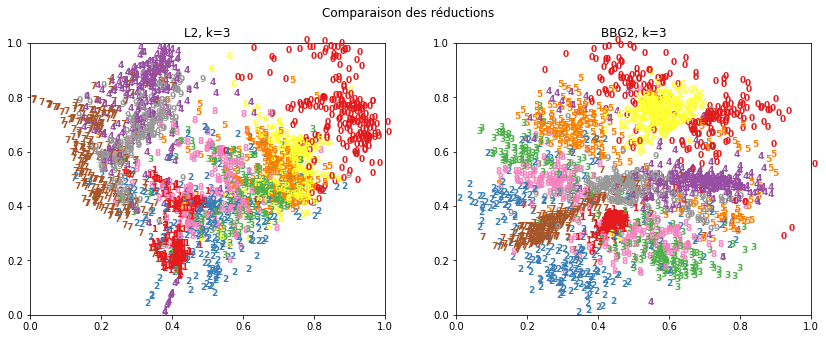

In [308]:
two_plots_2D_embedding(L2_iso, bbg2_iso, y_train, title1="L2, k=3", title2="BBG2, k=3")

On remarque immédiatement que BBG2 possède de manière générale des regroupements plus concentrés et plus éloignés les uns des autres. L'unique avantage de L2 semble être au niveau des "0" qui ont clairement leur coin distinctif.

De façon générale, BBG2 me paraît être une meilleure approche pour la visualisation (ou la séparation) des regroupements. En soit, ultimement, si les regroupements sont plus distincts et concentrés, intuitivement, on pourrait se convaincre qu'il serait plus facile de classifier les données.

# Conclusion

Concluons avec un retour sur les algorithmes:

| Modèle                | Relation des performances      |
| --------------------- | ------------------------------ |
| **KNN**               | $BBG_2 > BBG_1 > L_2$          |
| **K-Médoïdes**        | $BBG_2 > BBG_1 > L_2$          |
| **Partition Binaire** | $BBG_1 > BBG_2 > L_2$          |
| **PCoA**              | $(BBG_2 = BBG_1) > L_2$        |
| **ISOMAP**            | $BBG_2 > BBG_1 > L_2$          |

De manière générale, le but du devoir a été atteint: j'ai proposé une (des!) méthodes de *preprocessing* en plus d'une métrique adaptée à MNIST qui surpassent les performances de L2.

Ma curiosité face à BBG1 vs BBG2 m'a tout même mené à faire une découverte intéressante: BBG1 est mieux adapté pour la Partition Binaire. Dans tous les autres cas, BBG2 était la meilleure approche.